In [1]:
import os
import pickle
from sklearn.metrics import balanced_accuracy_score
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
import seaborn as sns
import shutil

In [2]:
import pandas as pd
import numpy as np
import random
from pathlib import Path
from collections import defaultdict

def load_samples_with_minimum_replacement(files, n_samples, used_indices_dict, seed, label=0):
    collected = []
    rng = np.random.default_rng(seed)
    random.seed(int(seed))

    random.shuffle(files)

    for file in files:
        df = pd.read_csv(file, delimiter="\t")
        df["Label"] = label
        total_indices = set(range(len(df)))
        used_indices = used_indices_dict[file]
        available_indices = list(total_indices - used_indices)

        # Number of samples to take from this file
        if n_samples <= 0:
            break

        if available_indices:
            take_n = min(len(available_indices), n_samples)
            chosen_indices = rng.choice(available_indices, size=take_n, replace=False)
            used_indices_dict[file].update(chosen_indices)
        else:
            take_n = min(len(df), n_samples)
            chosen_indices = rng.choice(list(total_indices), size=take_n, replace=True)

        sampled = df.iloc[chosen_indices].copy()
        sampled["Label"] = label
        collected.append(sampled)

        n_samples -= take_n

    # If still not enough samples collected, fill remainder randomly (with replacement)
    if n_samples > 0:
        while n_samples > 0:
            file = random.choice(files)
            df = pd.read_csv(file, delimiter="\t")
            df["Label"] = label
            total_rows = len(df)

            take_n = min(total_rows, n_samples)
            chosen_indices = rng.choice(range(total_rows), size=take_n, replace=True)
            sampled = df.iloc[chosen_indices].copy()
            sampled["Label"] = label
            collected.append(sampled)

            n_samples -= take_n

    return pd.concat(collected, ignore_index=True)


def load_samples_without_replacement(files, n_samples, used_indices_dict, seed, label=0):
    collected = []
    rng = np.random.default_rng(seed)
    total_available = sum(len(pd.read_csv(f)) - len(used_indices_dict[f]) for f in files)

    if total_available < n_samples:
        raise ValueError(f"Not enough unused samples. Needed {n_samples}, but only {total_available} available.")

    while n_samples > 0:
        file = random.choice(files)
        df = pd.read_csv(file, delimiter="\t")
        
        df["Label"] = label
        

        used_indices = used_indices_dict[file]
        available_indices = list(set(range(len(df))) - used_indices)

        if not available_indices:
            continue

        take_n = min(len(available_indices), n_samples)
        chosen_indices = rng.choice(available_indices, size=take_n, replace=False)
        sampled = df.iloc[chosen_indices]
        collected.append(sampled)

        # Mark these indices as used
        used_indices_dict[file].update(chosen_indices)
        n_samples -= take_n

    return pd.concat(collected, ignore_index=True)

def create_mock_datasets(
    positive_files, negative_files, Experiment_Type = "AML experiment",
    total_samples=500, 
    ratios=None, 
    output_dir="./mock_datasets", 
    seed=90
):
    output_dir = os.path.join(output_dir, Experiment_Type)
    # If directory exists, delete it
    if os.path.exists(output_dir):
        shutil.rmtree(output_dir)
    Path(output_dir).mkdir(parents=True, exist_ok=False)

    if ratios is None:
        ratios = [0.01, 0.1, 0.25, 0.5, 0.75, 0.90, 0.99]

    random.seed(int(seed))
    np.random.seed(seed)

    # Track used indices per file
    used_pos_indices = defaultdict(set)
    used_neg_indices = defaultdict(set)

    ratio_count = 1
    for ratio in ratios:
        n_pos = int(total_samples * ratio)
        n_neg = total_samples - n_pos

        df_pos = (
            load_samples_with_minimum_replacement(positive_files, n_pos, used_pos_indices, seed*ratio_count, label=1)
            if n_pos > 0 else pd.DataFrame()
        )
        df_neg = (
            load_samples_with_minimum_replacement(negative_files, n_neg, used_neg_indices, seed*ratio_count, label=0)
            if n_neg > 0 else pd.DataFrame()
        )

        df_combined = pd.concat([df_pos, df_neg], ignore_index=True)
        df_combined = df_combined.sample(frac=1, random_state=seed).reset_index(drop=True)

        out_path = Path(output_dir) / f"mock_{int(ratio*100):02d}_pos.csv"
        df_combined.to_csv(out_path, index=False, sep="\t")
        print(f"Saved {out_path} with {n_pos} positive and {n_neg} negative samples.")
        ratio_count = ratio_count + 1



In [3]:
def DataFrame_Channel_Based(Feature_Type, Dataframe, Channels, Required_Channels, Cell_Profiler_Channels_Annotation = None): #Please provide Cell_Profiler_Channels_Annotation if using Cell Profiler Features
   
    pre_saved_labels = None
    if "Label" in Dataframe.columns:
        pre_saved_labels = Dataframe["Label"]
        Dataframe = Dataframe.drop("Label", axis=1)
    
    list_columns = list(Dataframe.columns)
    desired_list = [i for i in list_columns if i not in ['Image_Type','Image_Name']]
    
    if Feature_Type == "Cell_Profiler":
        Annotated_Channels = [Cell_Profiler_Channels_Annotation[i] for i in Channels]
        Required_Annotated_Channels = [Cell_Profiler_Channels_Annotation[i] for i in Required_Channels]

        Columns_list_reference = []
        for each_channel in Annotated_Channels:
            for each_column in desired_list:
                if each_channel in desired_list:
                    Columns_list_reference.append(each_column.replace(each_channel, "ChangeChannel"))
                else:
                    Columns_list_reference.append(each_column)
        Columns_list_reference = list(np.unique(Columns_list_reference))
        Chosen_Columns = []
        for each_channel in Required_Annotated_Channels:
            for each_column in Columns_list_reference:
                if "ChangeChannel" in each_column:
                    Chosen_Columns.append(each_column.replace("ChangeChannel", each_channel))
                else:
                    Chosen_Columns.append(each_column)
        columns_names = list(np.unique(Columns_list_reference))
        
    else:
        index_list = []
        for i in Required_Channels:
            index_list.append(Channels.index(i))
        annotated = False
        for i in desired_list:
            for s in Required_Channels:
                if s in i:
                    annotated = True
                if annotated==True:
                    break
        if annotated==True:
            columns_names = []
            for i in desired_list:
                for s in Required_Channels:
                    if s in i:
                        columns_names.append(i)
        else:
            desired_columns_annotation = [int(i.split(".")[-1]) if len(i.split("."))>1 else 0 for i in desired_list]
            columns_names = [s for i,s in zip(desired_columns_annotation, desired_list) if i in  index_list]

    
    if pre_saved_labels is not None:
        Dataframe["Label"] = pre_saved_labels
        columns_names = ['Image_Type','Image_Name'] + columns_names + ["Label"]
        
    else:
        columns_names = ['Image_Type','Image_Name'] + columns_names
    
    return Dataframe[columns_names]

In [4]:
import os
import pandas as pd
import pickle
import matplotlib.pyplot as plt
from sklearn.metrics import balanced_accuracy_score

def evaluate_mock_datasets_and_plot(
    mock_dir,
    model_file,
    data_type,
    all_channels,
    selected_channels,
    sep="\t",
    threshold_mutation = 0.5,
    Experiment_Type = "AML experiment",
    pdf_output_path="mock_dataset.pdf"
):
    #from your_module import DataFrame_Channel_Based  # Replace with actual import if needed

   
    # Set Seaborn theme
    sns.set(style="whitegrid", context="paper", font_scale=1.4)

    # Load model
    model = pickle.load(open(model_file, "rb"))
    feature_columns = model.get_booster().feature_names
    # Collect scores
    score_dict = {}
    score_dict_percentage = {}
    for fname in sorted(os.listdir(mock_dir)):
        if not fname.endswith(".csv"):
            continue

        perc_str = fname.split("_")[1]  # e.g., "01"
        perc_float = int(perc_str) #/ 100
        label = f"{perc_float:.2f}%"
        fpath = os.path.join(mock_dir, Experiment_Type, fname)

        # Load and preprocess
        dataset = pd.read_csv(fpath, sep=sep)
        dataset = DataFrame_Channel_Based(data_type, dataset, all_channels, selected_channels)
        true_labels = dataset["Label"]

        dataset_to_test = dataset[feature_columns]
        probabilities = model.predict_proba(dataset_to_test)
        predictions = (probabilities[:,1]>threshold_mutation).astype(int)
        

        percentage_true = np.sum(predictions)/(len(predictions))*100#-np.sum(true_labels))

        score_dict_percentage[label] = percentage_true

        score = balanced_accuracy_score(true_labels, predictions)
        score_dict[label] = score

    # Sort by % positive (convert labels like '0.01%' → float)
    sorted_items = sorted(score_dict.items(), key=lambda x: float(x[0].strip('%')))
    labels = [k for k, _ in sorted_items]
    scores = [v for _, v in sorted_items]

    # Plot
    plt.figure(figsize=(10, 6), dpi=600)
    colors = sns.color_palette("Blues_d", len(scores))

    bars = plt.bar(labels, scores, color=colors)

    plt.ylabel("Balanced Accuracy Score", fontsize=16)
    plt.xlabel("Positive Class Proportion", fontsize=16)
    plt.title(f"Model Performance vs Positive Class Proportion\nThreshold for classification {threshold_mutation}", fontsize=18)
    plt.xticks(rotation=45, ha="right")
    plt.ylim(0, 1.05)
    plt.tight_layout()

    # Add value labels
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.02,
            f"{height:.2f}",
            ha="center",
            va="bottom",
            fontsize=10
        )
    plt.savefig(f"{pdf_output_path}_{Experiment_Type}_{threshold_mutation}_balanced_accuracy_scores.pdf", bbox_inches="tight")
    plt.show()

    print(f"Plot saved to: {pdf_output_path}_{Experiment_Type}_{threshold_mutation}_balanced_accuracy_scores")

    # Sort by % positive (convert labels like '0.01%' → float)
    sorted_items = sorted(score_dict_percentage.items(), key=lambda x: float(x[0].strip('%')))
    labels = [k for k, _ in sorted_items]
    scores = [v for _, v in sorted_items]

    # Plot
    plt.figure(figsize=(10, 6), dpi=600)
    colors = sns.color_palette("Blues_d", len(scores))

    bars = plt.bar(labels, scores, color=colors)

    plt.ylabel("Predicted Positive Class Percentage", fontsize=16)
    plt.xlabel("Positive Class Proportion", fontsize=16)
    plt.title(f"Model Performance vs Positive Class Proportion\nThreshold for classification {threshold_mutation}", fontsize=18)
    plt.xticks(rotation=45, ha="right")
    #plt.ylim(0, 105)
    plt.tight_layout()
    #plt.yscale("log")

    # Add value labels
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.02,
            f"{height:.2f}%",
            ha="center",
            va="bottom",
            fontsize=10
        )
    plt.savefig(f"{pdf_output_path}_{Experiment_Type}_{threshold_mutation}_percentage.pdf", bbox_inches="tight")
    plt.show()

    print(f"Plot saved to: {pdf_output_path}_{Experiment_Type}_{threshold_mutation}_percentage")
    return score_dict


In [6]:
Experiment_Type = "AML experiment"

In [7]:
# Example usage
# Assuming files:
positive_files = [
    "Properties_Table_CIF_3_PDX1-Mouse2_10_hCD45.csv", 
    "Properties_Table_CIF_3_PDX1-Mouse2_11_R3 & R2 & R1_hCD45.csv",
    "Properties_Table_CIF_3_PDX2-Mouse3_7_hCD45.csv",
]
negative_files = [
    "Properties_Table_CIF_5_Healthy FHCC donor 1.csv",
    "Properties_Table_CIF_11_MCW donor 001 re-capture at FHCC.csv", 
    "Properties_Table_CIF_5_Healthy UKHD donor 1.csv",
    "Properties_Table_CIF_Human.csv"]


In [112]:
create_mock_datasets(positive_files, negative_files, Experiment_Type, ratios = [0.01, 0.05, 0.1, 0.5, 0.95, 0.99], seed=60)

Saved mock_datasets/AML experiment/mock_01_pos.csv with 5 positive and 495 negative samples.
Saved mock_datasets/AML experiment/mock_05_pos.csv with 25 positive and 475 negative samples.
Saved mock_datasets/AML experiment/mock_10_pos.csv with 50 positive and 450 negative samples.
Saved mock_datasets/AML experiment/mock_50_pos.csv with 250 positive and 250 negative samples.
Saved mock_datasets/AML experiment/mock_95_pos.csv with 475 positive and 25 negative samples.
Saved mock_datasets/AML experiment/mock_99_pos.csv with 495 positive and 5 negative samples.


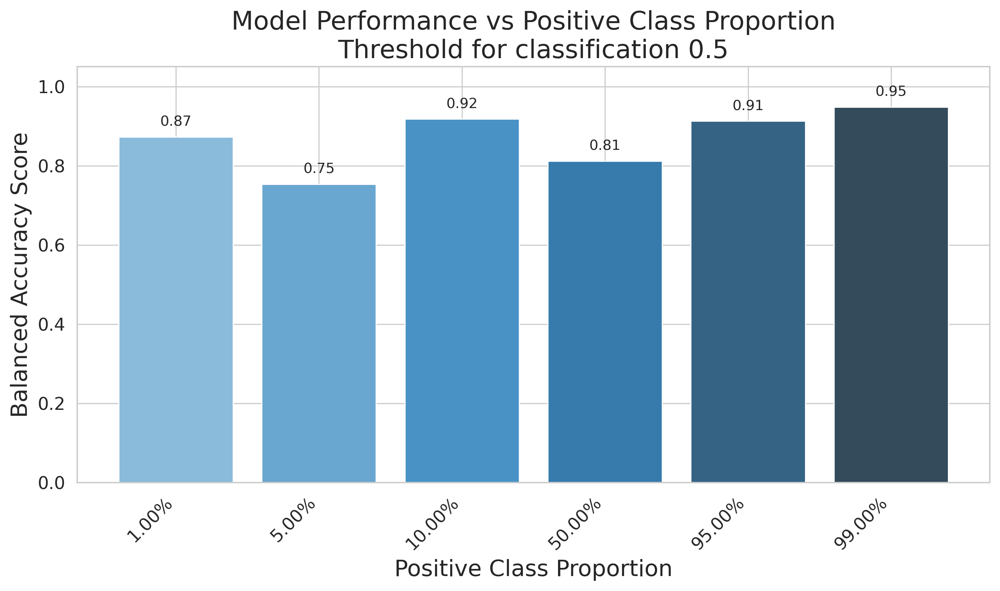

Plot saved to: mock_datasets/mock_dataset_AML experiment_0.5_balanced_accuracy_scores


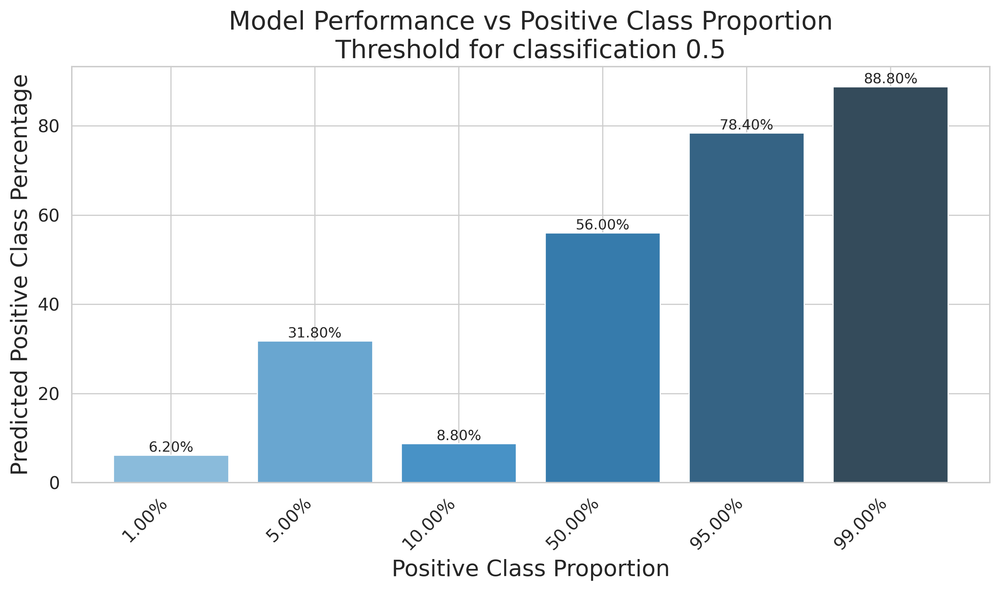

Plot saved to: mock_datasets/mock_dataset_AML experiment_0.5_percentage


In [113]:
score_dict = evaluate_mock_datasets_and_plot(
    mock_dir="mock_datasets/",
    model_file="External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV/Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14/Test_0/Xgboost_Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14_SkImage_AML experiment_with_External_Training_Ch1_Ch6_External_Test_before_final_conserve_model_Ch1_Ch6_Checkpoint.pkl",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch6"],
    Experiment_Type = "AML experiment",
    pdf_output_path="mock_datasets/mock_dataset"
)


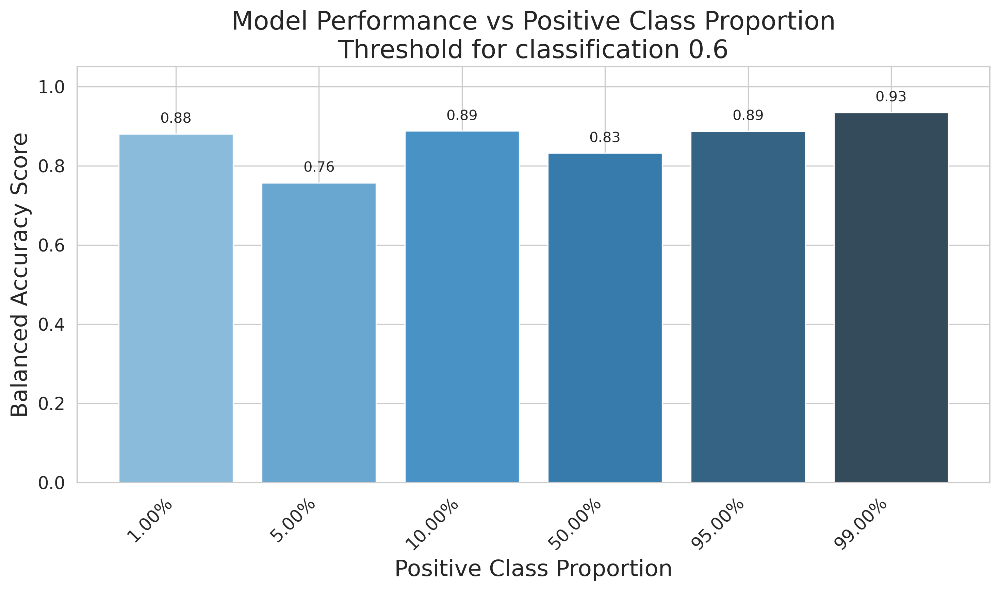

Plot saved to: mock_datasets/mock_dataset_AML experiment_0.6_balanced_accuracy_scores


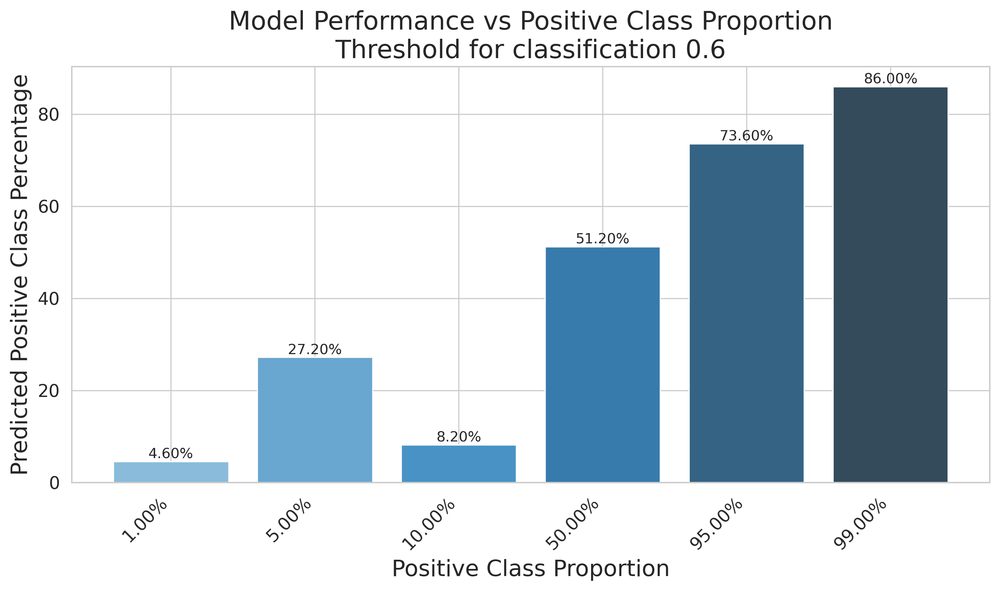

Plot saved to: mock_datasets/mock_dataset_AML experiment_0.6_percentage


In [114]:
score_dict = evaluate_mock_datasets_and_plot(
    mock_dir="mock_datasets/",
    model_file="External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV/Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14/Test_0/Xgboost_Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14_SkImage_AML experiment_with_External_Training_Ch1_Ch6_External_Test_before_final_conserve_model_Ch1_Ch6_Checkpoint.pkl",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch5", "Ch6"],
    threshold_mutation = 0.6,
    Experiment_Type = "AML experiment",
    pdf_output_path="mock_datasets/mock_dataset"
)


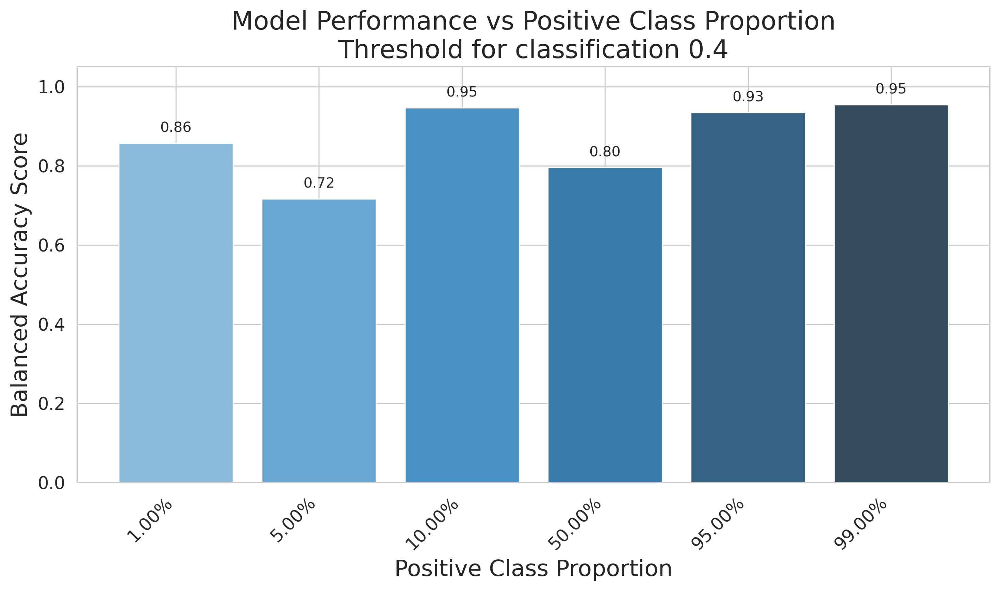

Plot saved to: mock_datasets/mock_dataset_AML experiment_0.4_balanced_accuracy_scores


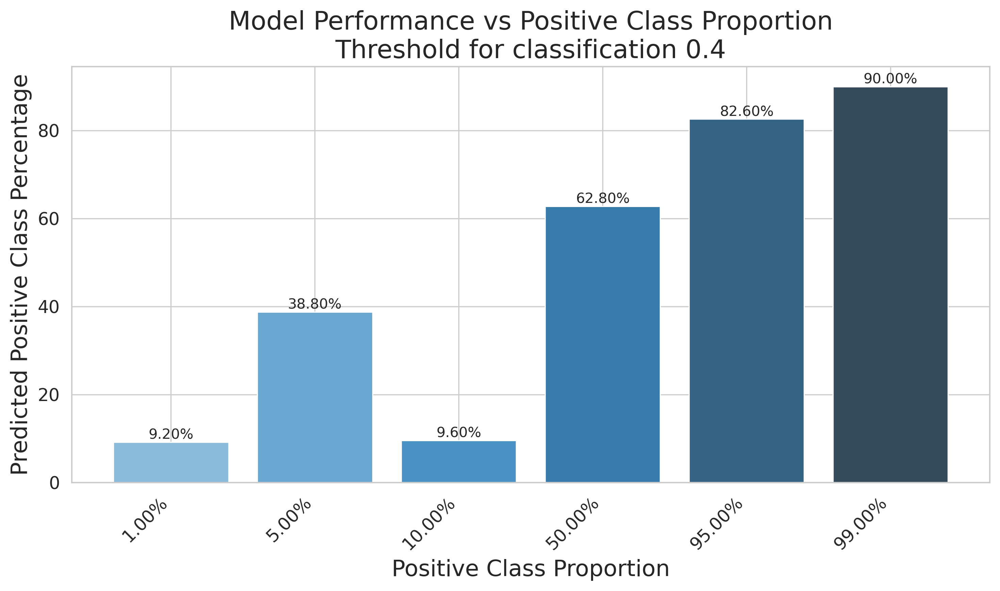

Plot saved to: mock_datasets/mock_dataset_AML experiment_0.4_percentage


In [115]:
score_dict = evaluate_mock_datasets_and_plot(
    mock_dir="mock_datasets/",
    model_file="External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV/Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14/Test_0/Xgboost_Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14_SkImage_AML experiment_with_External_Training_Ch1_Ch6_External_Test_before_final_conserve_model_Ch1_Ch6_Checkpoint.pkl",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch6"],
    threshold_mutation = 0.4,
    Experiment_Type = "AML experiment",
    pdf_output_path="mock_datasets/mock_dataset"
)


In [116]:
Experiment_Type = "Jak2 experiment"

In [117]:
# Example usage
# Assuming files:
positive_files = [
    "Properties_Table_CIF_3_JAK2-GZ01_9_R3&R2&R1.csv", 
    "Properties_Table_CIF_3_JAK2-GZ01_8_R2&R1.csv",
    #"Properties_Table_CIF_10_JAK2-GZ02_1_R4&R3&R2&R1.csv",
    #"Properties_Table_CIF_10_JAK2-GZ03_1_R2&R1.csv"
]
negative_files = [
    "Properties_Table_CIF_5_Healthy FHCC donor 1.csv",
    "Properties_Table_CIF_11_MCW donor 001 re-capture at FHCC.csv", 
    "Properties_Table_CIF_5_Healthy UKHD donor 1.csv",
    "Properties_Table_CIF_Human.csv"]


In [118]:
create_mock_datasets(positive_files, negative_files, Experiment_Type, ratios = [0.01, 0.05, 0.1, 0.5, 0.95, 0.99], seed=60)

Saved mock_datasets/Jak2 experiment/mock_01_pos.csv with 5 positive and 495 negative samples.
Saved mock_datasets/Jak2 experiment/mock_05_pos.csv with 25 positive and 475 negative samples.
Saved mock_datasets/Jak2 experiment/mock_10_pos.csv with 50 positive and 450 negative samples.
Saved mock_datasets/Jak2 experiment/mock_50_pos.csv with 250 positive and 250 negative samples.
Saved mock_datasets/Jak2 experiment/mock_95_pos.csv with 475 positive and 25 negative samples.
Saved mock_datasets/Jak2 experiment/mock_99_pos.csv with 495 positive and 5 negative samples.


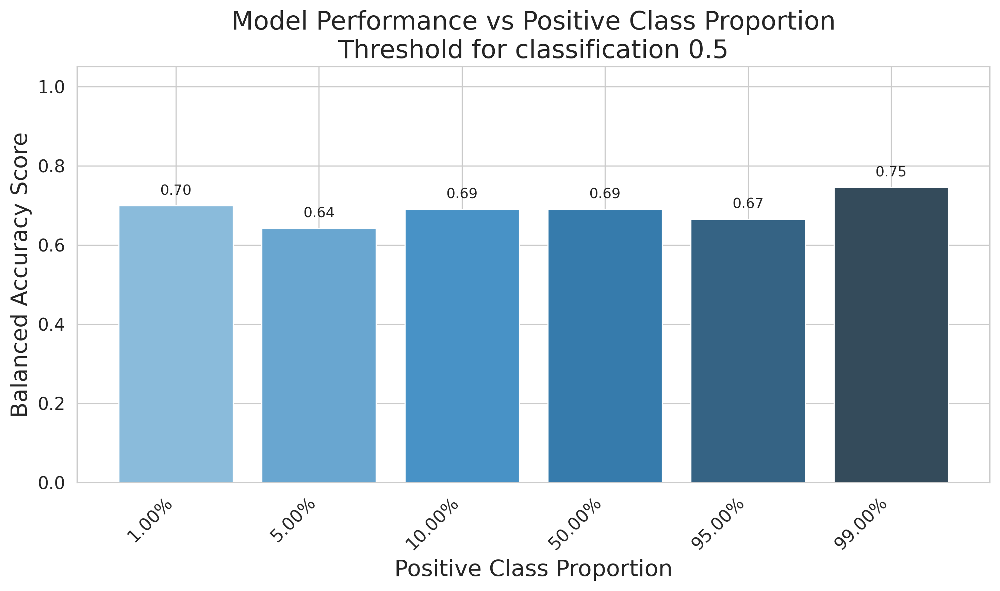

Plot saved to: mock_datasets/mock_dataset_Jak2 experiment_0.5_balanced_accuracy_scores


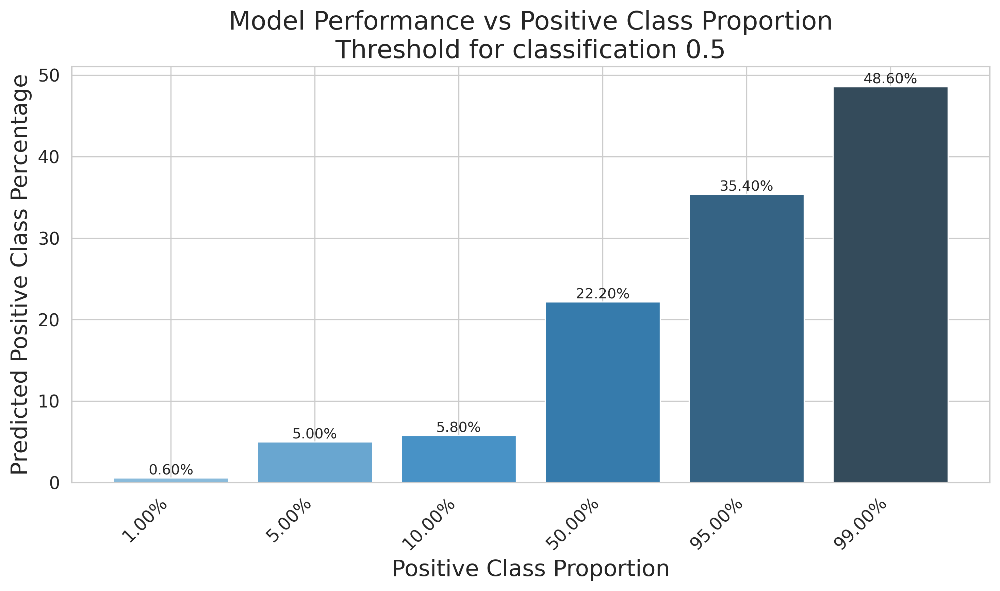

Plot saved to: mock_datasets/mock_dataset_Jak2 experiment_0.5_percentage


In [119]:
score_dict = evaluate_mock_datasets_and_plot(
    mock_dir="mock_datasets/",
    model_file = "External_Test_before_final_conserve_model_BA_F1_CV/Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2/Test_0/Xgboost_Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2_SkImage_Jak2 experiment_with_External_Training_Ch1_Ch5_Ch6_External_Test_before_final_conserve_model_Checkpoint.pkl",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch5", "Ch6"],
    Experiment_Type = "Jak2 experiment",
    pdf_output_path="mock_datasets/mock_dataset"
)


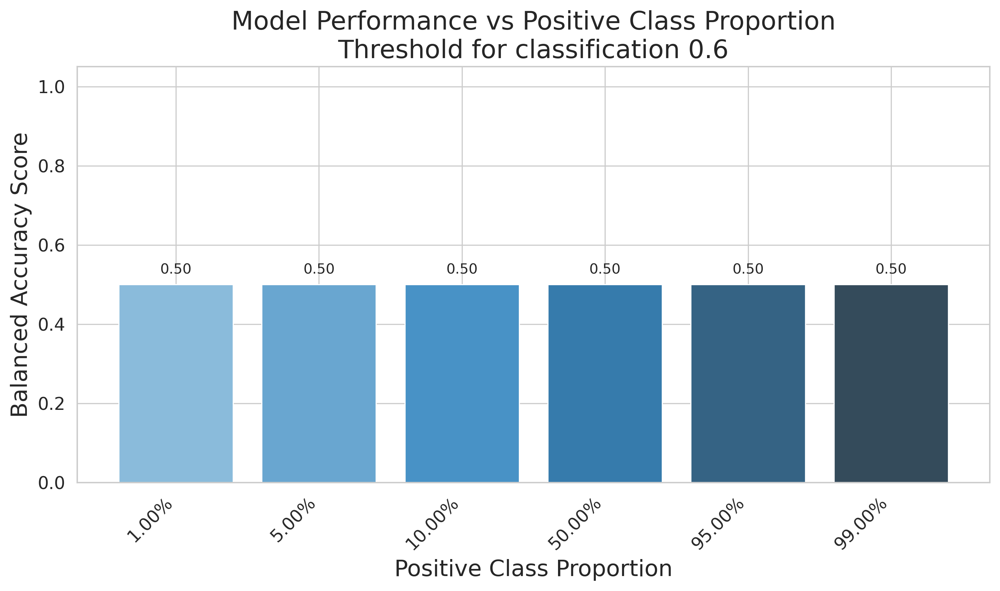

Plot saved to: mock_datasets/mock_dataset_Jak2 experiment_0.6_balanced_accuracy_scores


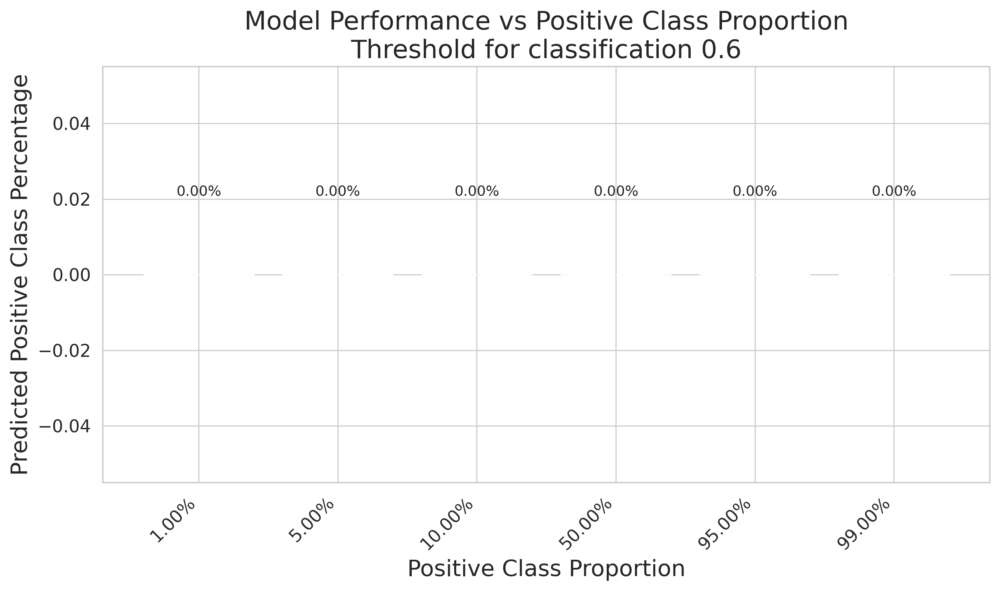

Plot saved to: mock_datasets/mock_dataset_Jak2 experiment_0.6_percentage


In [120]:
score_dict = evaluate_mock_datasets_and_plot(
    mock_dir="mock_datasets/",
    model_file = "External_Test_before_final_conserve_model_BA_F1_CV/Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2/Test_0/Xgboost_Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2_SkImage_Jak2 experiment_with_External_Training_Ch1_Ch5_Ch6_External_Test_before_final_conserve_model_Checkpoint.pkl",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch5", "Ch6"],
    threshold_mutation = 0.6,
    Experiment_Type = "Jak2 experiment",
    pdf_output_path="mock_datasets/mock_dataset"
)


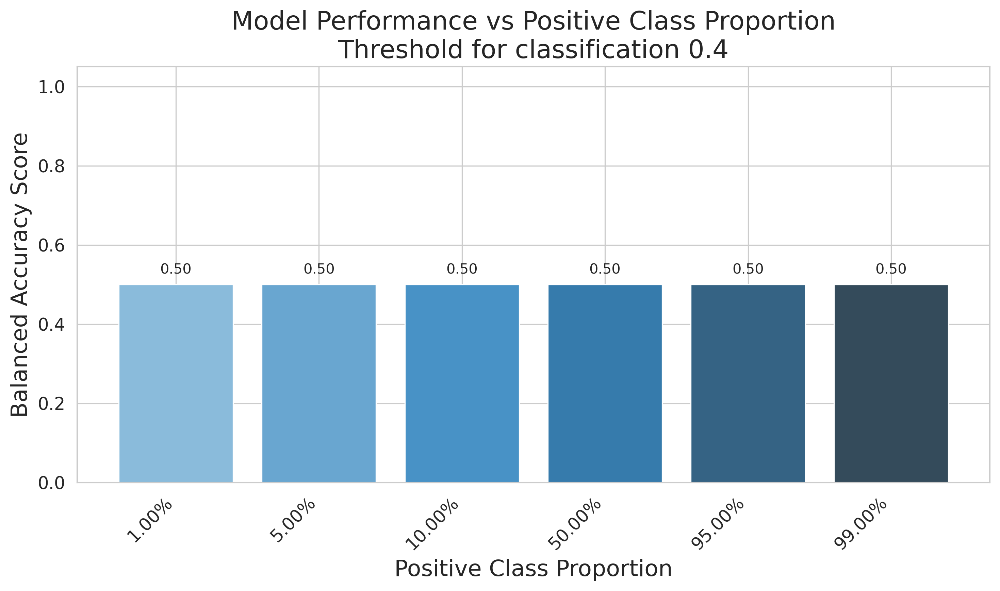

Plot saved to: mock_datasets/mock_dataset_Jak2 experiment_0.4_balanced_accuracy_scores


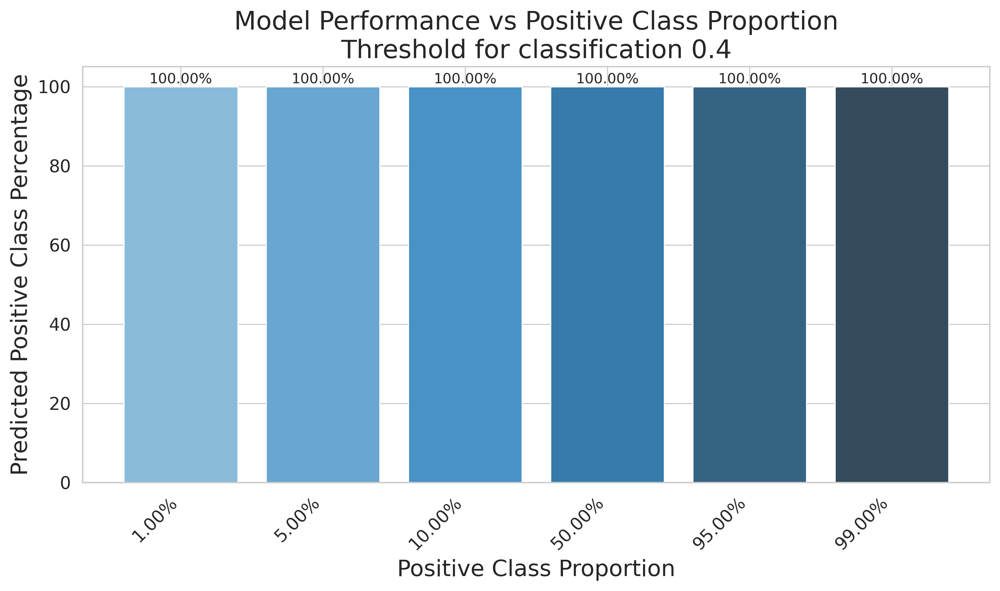

Plot saved to: mock_datasets/mock_dataset_Jak2 experiment_0.4_percentage


In [121]:
score_dict = evaluate_mock_datasets_and_plot(
    mock_dir="mock_datasets/",
    model_file = "External_Test_before_final_conserve_model_BA_F1_CV/Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2/Test_0/Xgboost_Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2_SkImage_Jak2 experiment_with_External_Training_Ch1_Ch5_Ch6_External_Test_before_final_conserve_model_Checkpoint.pkl",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch5", "Ch6"],
    threshold_mutation = 0.4,
    Experiment_Type = "Jak2 experiment",
    pdf_output_path="mock_datasets/mock_dataset"
)


In [5]:
import os
import pandas as pd
import pickle
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import balanced_accuracy_score
import matplotlib.ticker as mtick
from sklearn.metrics import f1_score

def run_multiple_seeds_and_plot(
    positive_files,
    negative_files,
    Experiment_Type,
    set_seed=42,
    model_file="...",
    mock_base_dir="mock_datasets/",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch6"],
    threshold_mutation=0.5,
    output_path="mock_datasets/multi_seed_plot"
):
    np.random.seed(42)
    seeds = list(np.random.randint(1, 1000, size=10))
    def evaluate_mock_datasets_and_plot_single_seed(
        seed
    ):
        #from your_module import create_mock_datasets, DataFrame_Channel_Based  # You should update this

        # Create mock datasets
        create_mock_datasets(positive_files, negative_files, Experiment_Type, seed=seed)

        # Load model
        model = pickle.load(open(model_file, "rb"))
        feature_columns = model.get_booster().feature_names

        score_dict = {}
        score_dict_percentage = {}
        result_list = []

        mock_dir = os.path.join(mock_base_dir, Experiment_Type)

        for fname in sorted(os.listdir(mock_dir)):
            if not fname.endswith(".csv"):
                continue

            perc_str = fname.split("_")[1]
            perc_float = int(perc_str)
            label = f"{perc_float:.2f}%"
            fpath = os.path.join(mock_dir, fname)

            # Load and preprocess
            dataset = pd.read_csv(fpath, sep="\t")
            dataset = DataFrame_Channel_Based(data_type, dataset, all_channels, selected_channels)
            true_labels = dataset["Label"]

            dataset_to_test = dataset[feature_columns]
            probabilities = model.predict_proba(dataset_to_test)
            predictions = (probabilities[:, 1] > threshold_mutation).astype(int)

            percentage_true = np.sum(predictions) / len(predictions) * 100
            score = balanced_accuracy_score(true_labels, predictions)
            F1_score = f1_score(true_labels, predictions)

            score_dict[label] = score
            score_dict_percentage[label] = percentage_true

            result_list.append({
                "Seed": f"Seed {seed}",
                "Positive_Proportion": float(label.strip('%')),
                "Balanced_Accuracy": score,
                "F1_score": F1_score,
                "Predicted_Positive_Percentage": percentage_true
            })

        return pd.DataFrame(result_list)

    # -----------------------------
    # Run for each seed
    # -----------------------------
    all_dfs = []
    for seed in seeds:
        print(f"Running for seed {seed}")
        df_seed = evaluate_mock_datasets_and_plot_single_seed(seed)
        all_dfs.append(df_seed)

    full_df = pd.concat(all_dfs, ignore_index=True)

    # -----------------------------
    # Plotting
    # -----------------------------
    sns.set(style="whitegrid", context="paper", font_scale=1.3)
    plt.figure(figsize=(10, 6), dpi=600)

    sns.scatterplot(
        data=full_df,
        x="Positive_Proportion",
        y="Balanced_Accuracy",
        hue="Seed",
        palette="tab10",
        s=80
    )
    
    # Regression lines per seed
    for seed in full_df["Seed"].unique():
        sub = full_df[full_df["Seed"] == seed]
        X = sub["Positive_Proportion"].values.reshape(-1, 1)
        y = sub["Balanced_Accuracy"].values
        model = LinearRegression().fit(X, y)
        x_range = np.linspace(min(X)[0], max(X)[0], 100)
        y_pred = model.predict(x_range.reshape(-1, 1))
        plt.plot(x_range, y_pred, label=f"{seed} fit", alpha=0.5)

    # Add percentage labels on each point
    #percentage_record_list = []
    #for _, row in full_df.iterrows():
    #    if int(row["Positive_Proportion"]) not in percentage_record_list:
    #        plt.text(
    #            row["Positive_Proportion"],               # x
    #            (min(full_df["Balanced_Accuracy"]))-0.03,         # y, slightly above the dot
    #            f'{int(row["Positive_Proportion"])}%',    # label text
    #            ha='center',
    #            va='bottom',
    #            fontsize=8,
    #            alpha=1
    #        )
    #        percentage_record_list.append(int(row["Positive_Proportion"]))


    # Global regression
    X_all = full_df["Positive_Proportion"].values.reshape(-1, 1)
    y_all = full_df["Balanced_Accuracy"].values
    global_model = LinearRegression().fit(X_all, y_all)
    y_global = global_model.predict(x_range.reshape(-1, 1))
    plt.plot(x_range, y_global, linestyle="--", color="black", label="Global trend")

    plt.xlabel("\nPositive Class Proportion (%)", fontsize = 10)
    plt.xticks(sorted(list(np.unique(X_all))))
    plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:.0f}%'))
    plt.ylabel("Balanced Accuracy Score")
    plt.ylim(min(full_df["Balanced_Accuracy"])-0.015, max(full_df["Balanced_Accuracy"])+0.01)
    plt.title(f"Balanced Accuracy vs Positive Class Proportion\n({Experiment_Type})")

    #plt.legend(
    #    loc="upper center",
    #    bbox_to_anchor=(0.5, 1.15),  # moved legend higher
    #    ncol=3,
    #    frameon=False
    #)

    plt.legend(
        loc='center left',
        bbox_to_anchor=(1, 0.5)
    )

    plt.subplots_adjust(top=0.75)  # push plot lower to make room for title + legend

    # Do NOT use plt.tight_layout()
    plt.savefig(f"{output_path}_balanced_accuracy_vs_proportion.pdf", bbox_inches="tight")
    plt.show()

    # -----------------------------
    # Plotting
    # -----------------------------
    sns.set(style="whitegrid", context="paper", font_scale=1.3)
    plt.figure(figsize=(10, 6), dpi=600)

    sns.scatterplot(
        data=full_df,
        x="Positive_Proportion",
        y="F1_score",
        hue="Seed",
        palette="tab10",
        s=80
    )
    
    # Regression lines per seed
    for seed in full_df["Seed"].unique():
        sub = full_df[full_df["Seed"] == seed]
        X = sub["Positive_Proportion"].values.reshape(-1, 1)
        y = sub["F1_score"].values
        model = LinearRegression().fit(X, y)
        x_range = np.linspace(min(X)[0], max(X)[0], 100)
        y_pred = model.predict(x_range.reshape(-1, 1))
        plt.plot(x_range, y_pred, label=f"{seed} fit", alpha=0.5)

    # Add percentage labels on each point
    #percentage_record_list = []
    #for _, row in full_df.iterrows():
    #    if int(row["Positive_Proportion"]) not in percentage_record_list:
    #        plt.text(
    #            row["Positive_Proportion"],               # x
    #            (min(full_df["Balanced_Accuracy"]))-0.03,         # y, slightly above the dot
    #            f'{int(row["Positive_Proportion"])}%',    # label text
    #            ha='center',
    #            va='bottom',
    #            fontsize=8,
    #            alpha=1
    #        )
    #        percentage_record_list.append(int(row["Positive_Proportion"]))


    # Global regression
    X_all = full_df["Positive_Proportion"].values.reshape(-1, 1)
    y_all = full_df["F1_score"].values
    global_model = LinearRegression().fit(X_all, y_all)
    y_global = global_model.predict(x_range.reshape(-1, 1))
    plt.plot(x_range, y_global, linestyle="--", color="black", label="Global trend")

    plt.xlabel("\nPositive Class Proportion (%)", fontsize = 10)
    plt.xticks(sorted(list(np.unique(X_all))))
    plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:.0f}%'))
    plt.ylabel("F1 Score")
    plt.ylim(min(full_df["F1_score"])-0.015, max(full_df["F1_score"])+0.01)
    plt.title(f"F1 Score vs Positive Class Proportion\n({Experiment_Type})")

    #plt.legend(
    #    loc="upper center",
    #    bbox_to_anchor=(0.5, 1.15),  # moved legend higher
    #    ncol=3,
    #    frameon=False
    #)

    plt.legend(
        loc='center left',
        bbox_to_anchor=(1, 0.5)
    )

    plt.subplots_adjust(top=0.75)  # push plot lower to make room for title + legend

    # Do NOT use plt.tight_layout()
    plt.savefig(f"{output_path}_f1score_vs_proportion.pdf", bbox_inches="tight")
    plt.show()

    # -----------------------------
    # Plotting
    # -----------------------------

    sns.set(style="whitegrid", context="paper", font_scale=1.3)
    plt.figure(figsize=(10, 6), dpi=600)

    sns.scatterplot(
        data=full_df,
        x="Positive_Proportion",
        y="Predicted_Positive_Percentage",
        hue="Seed",
        palette="tab10",
        s=80
    )
    
    # Regression lines per seed
    for seed in full_df["Seed"].unique():
        sub = full_df[full_df["Seed"] == seed]
        X = sub["Positive_Proportion"].values.reshape(-1, 1)
        y = sub["Predicted_Positive_Percentage"].values
        model = LinearRegression().fit(X, y)
        x_range = np.linspace(min(X)[0], max(X)[0], 100)
        y_pred = model.predict(x_range.reshape(-1, 1))
        plt.plot(x_range, y_pred, label=f"{seed} fit", alpha=0.5)

    # Add percentage labels on each point
    #percentage_record_list = []
    #for _, row in full_df.iterrows():
    #    if int(row["Positive_Proportion"]) not in percentage_record_list:
    #        plt.text(
    #            row["Positive_Proportion"],               # x
    #            -5,         # y, slightly above the dot
    #            f'{int(row["Positive_Proportion"])}%',    # label text
    #            ha='center',
    #            va='bottom',
    #            fontsize=8,
    #            alpha=1
    #        )
    #        percentage_record_list.append(int(row["Positive_Proportion"]))


    # Global regression
    X_all = full_df["Positive_Proportion"].values.reshape(-1, 1)
    y_all = full_df["Predicted_Positive_Percentage"].values
    global_model = LinearRegression().fit(X_all, y_all)
    y_global = global_model.predict(x_range.reshape(-1, 1))
    plt.plot(x_range, y_global, linestyle="--", color="black", label="Global trend")

    plt.xlabel("\nPositive Class Proportion (%)", fontsize = 10)
    plt.xticks(sorted(list(np.unique(X_all))))
    plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:.0f}%'))
    plt.ylabel("Predicted Positive Percentage")
    plt.ylim(0, 100)
    plt.yticks(np.arange(0, 100, 5))
    plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f'{y:.0f}%'))
    plt.title(f"Predicted Positive Percentage vs Positive Class Proportion\n({Experiment_Type})")

    #plt.legend(
    #    loc="upper center",
    #    bbox_to_anchor=(0.5, 1.15),  # moved legend higher
    #    ncol=3,
    #    frameon=False
    #)

    plt.legend(
        loc='center left',
        bbox_to_anchor=(1, 0.5)
    )

    plt.subplots_adjust(top=0.75)  # push plot lower to make room for title + legend

    # Do NOT use plt.tight_layout()
    plt.savefig(f"{output_path}_predicted_positive_percentage_vs_proportion.pdf", bbox_inches="tight")
    plt.show()

    return full_df


In [6]:
import os
import pandas as pd
import pickle
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import balanced_accuracy_score
import matplotlib.ticker as mtick
from sklearn.metrics import f1_score

def run_multiple_threshold_and_plot(
    positive_files,
    negative_files,
    Experiment_Type,
    seed=42,
    model_file="...",
    mock_base_dir="mock_datasets/",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch6"],
    threshold_mutations=[0.2,0.3,0.4,0.5,0.6,0.7,0.8],
    output_path="mock_datasets/multi_threshold_plot"
):
    np.random.seed(42)
    #seeds = list(np.random.randint(1, 1000, size=10))
    def evaluate_mock_datasets_and_plot_single_threshold(
        threshold_mutation
    ):
        #from your_module import create_mock_datasets, DataFrame_Channel_Based  # You should update this

        # Create mock datasets
        create_mock_datasets(positive_files, negative_files, Experiment_Type, seed=seed)

        # Load model
        model = pickle.load(open(model_file, "rb"))
        feature_columns = model.get_booster().feature_names

        score_dict = {}
        score_dict_percentage = {}
        result_list = []

        mock_dir = os.path.join(mock_base_dir, Experiment_Type)

        for fname in sorted(os.listdir(mock_dir)):
            if not fname.endswith(".csv"):
                continue

            perc_str = fname.split("_")[1]
            perc_float = int(perc_str)
            label = f"{perc_float:.2f}%"
            fpath = os.path.join(mock_dir, fname)

            # Load and preprocess
            dataset = pd.read_csv(fpath, sep="\t")
            dataset = DataFrame_Channel_Based(data_type, dataset, all_channels, selected_channels)
            true_labels = dataset["Label"]

            dataset_to_test = dataset[feature_columns]
            probabilities = model.predict_proba(dataset_to_test)
            predictions = (probabilities[:, 1] > threshold_mutation).astype(int)

            percentage_true = np.sum(predictions) / len(predictions) * 100
            score = balanced_accuracy_score(true_labels, predictions)
            F1_score = f1_score(true_labels, predictions)

            score_dict[label] = score
            score_dict_percentage[label] = percentage_true

            result_list.append({
                "Threshold": f"Threshold {threshold_mutation}",
                "Positive_Proportion": float(label.strip('%')),
                "Balanced_Accuracy": score,
                "F1_score": F1_score,
                "Predicted_Positive_Percentage": percentage_true
            })

        return pd.DataFrame(result_list)

    # -----------------------------
    # Run for each seed
    # -----------------------------
    all_dfs = []
    for threshold_mutation in threshold_mutations:
        print(f"Running for threshold {threshold_mutation}")
        df_threshold = evaluate_mock_datasets_and_plot_single_threshold(threshold_mutation)
        all_dfs.append(df_threshold)

    full_df = pd.concat(all_dfs, ignore_index=True)

    # -----------------------------
    # Plotting
    # -----------------------------
    sns.set(style="whitegrid", context="paper", font_scale=1.3)
    plt.figure(figsize=(10, 6), dpi=600)

    sns.scatterplot(
        data=full_df,
        x="Positive_Proportion",
        y="Balanced_Accuracy",
        hue="Threshold",
        palette="tab10",
        s=80
    )
    
    # Regression lines per seed
    for threshold in full_df["Threshold"].unique():
        sub = full_df[full_df["Threshold"] == threshold]
        X = sub["Positive_Proportion"].values.reshape(-1, 1)
        y = sub["Balanced_Accuracy"].values
        model = LinearRegression().fit(X, y)
        x_range = np.linspace(min(X)[0], max(X)[0], 100)
        y_pred = model.predict(x_range.reshape(-1, 1))
        plt.plot(x_range, y_pred, label=f"{threshold} fit", alpha=0.5)

    # Add percentage labels on each point
    #percentage_record_list = []
    #for _, row in full_df.iterrows():
    #    if int(row["Positive_Proportion"]) not in percentage_record_list:
    #        plt.text(
    #            row["Positive_Proportion"],               # x
    #            (min(full_df["Balanced_Accuracy"]))-0.03,         # y, slightly above the dot
    #            f'{int(row["Positive_Proportion"])}%',    # label text
    #            ha='center',
    #            va='bottom',
    #            fontsize=8,
    #            alpha=1
    #        )
    #        percentage_record_list.append(int(row["Positive_Proportion"]))


    # Global regression
    X_all = full_df["Positive_Proportion"].values.reshape(-1, 1)
    y_all = full_df["Balanced_Accuracy"].values
    global_model = LinearRegression().fit(X_all, y_all)
    y_global = global_model.predict(x_range.reshape(-1, 1))
    plt.plot(x_range, y_global, linestyle="--", color="black", label="Global trend")

    plt.xlabel("\nPositive Class Proportion (%)", fontsize = 10)
    plt.xticks(sorted(list(np.unique(X_all))))
    plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:.0f}%'))
    plt.ylabel("Balanced Accuracy Score")
    plt.ylim(min(full_df["Balanced_Accuracy"])-0.015, max(full_df["Balanced_Accuracy"])+0.01)
    plt.title(f"Balanced Accuracy vs Positive Class Proportion\n({Experiment_Type})")

    #plt.legend(
    #    loc="upper center",
    #    bbox_to_anchor=(0.5, 1.15),  # moved legend higher
    #    ncol=3,
    #    frameon=False
    #)

    plt.legend(
        loc='center left',
        bbox_to_anchor=(1, 0.5)
    )

    plt.subplots_adjust(top=0.75)  # push plot lower to make room for title + legend

    # Do NOT use plt.tight_layout()
    plt.savefig(f"{output_path}_balanced_accuracy_vs_proportion.pdf", bbox_inches="tight")
    plt.show()

    # -----------------------------
    # Plotting
    # -----------------------------
    sns.set(style="whitegrid", context="paper", font_scale=1.3)
    plt.figure(figsize=(10, 6), dpi=600)

    sns.scatterplot(
        data=full_df,
        x="Positive_Proportion",
        y="F1_score",
        hue="Threshold",
        palette="tab10",
        s=80
    )
    
    # Regression lines per seed
    for seed in full_df["Threshold"].unique():
        sub = full_df[full_df["Threshold"] == seed]
        X = sub["Positive_Proportion"].values.reshape(-1, 1)
        y = sub["F1_score"].values
        model = LinearRegression().fit(X, y)
        x_range = np.linspace(min(X)[0], max(X)[0], 100)
        y_pred = model.predict(x_range.reshape(-1, 1))
        plt.plot(x_range, y_pred, label=f"{seed} fit", alpha=0.5)

    # Add percentage labels on each point
    #percentage_record_list = []
    #for _, row in full_df.iterrows():
    #    if int(row["Positive_Proportion"]) not in percentage_record_list:
    #        plt.text(
    #            row["Positive_Proportion"],               # x
    #            (min(full_df["Balanced_Accuracy"]))-0.03,         # y, slightly above the dot
    #            f'{int(row["Positive_Proportion"])}%',    # label text
    #            ha='center',
    #            va='bottom',
    #            fontsize=8,
    #            alpha=1
    #        )
    #        percentage_record_list.append(int(row["Positive_Proportion"]))


    # Global regression
    X_all = full_df["Positive_Proportion"].values.reshape(-1, 1)
    y_all = full_df["F1_score"].values
    global_model = LinearRegression().fit(X_all, y_all)
    y_global = global_model.predict(x_range.reshape(-1, 1))
    plt.plot(x_range, y_global, linestyle="--", color="black", label="Global trend")

    plt.xlabel("\nPositive Class Proportion (%)", fontsize = 10)
    plt.xticks(sorted(list(np.unique(X_all))))
    plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:.0f}%'))
    plt.ylabel("F1 Score")
    plt.ylim(min(full_df["F1_score"])-0.015, max(full_df["F1_score"])+0.01)
    plt.title(f"F1 Score vs Positive Class Proportion\n({Experiment_Type})")

    #plt.legend(
    #    loc="upper center",
    #    bbox_to_anchor=(0.5, 1.15),  # moved legend higher
    #    ncol=3,
    #    frameon=False
    #)

    plt.legend(
        loc='center left',
        bbox_to_anchor=(1, 0.5)
    )

    plt.subplots_adjust(top=0.75)  # push plot lower to make room for title + legend

    # Do NOT use plt.tight_layout()
    plt.savefig(f"{output_path}_f1score_vs_proportion.pdf", bbox_inches="tight")
    plt.show()

     # -----------------------------
    # Plotting
    # -----------------------------

    sns.set(style="whitegrid", context="paper", font_scale=1.3)
    plt.figure(figsize=(10, 6), dpi=600)

    sns.scatterplot(
        data=full_df,
        x="Positive_Proportion",
        y="Predicted_Positive_Percentage",
        hue="Threshold",
        palette="tab10",
        s=80
    )
    
    # Regression lines per seed
    for threshold in full_df["Threshold"].unique():
        sub = full_df[full_df["Threshold"] == threshold]
        X = sub["Positive_Proportion"].values.reshape(-1, 1)
        y = sub["Predicted_Positive_Percentage"].values
        model = LinearRegression().fit(X, y)
        x_range = np.linspace(min(X)[0], max(X)[0], 100)
        y_pred = model.predict(x_range.reshape(-1, 1))
        plt.plot(x_range, y_pred, label=f"{threshold} fit", alpha=0.5)

    # Add percentage labels on each point
    #percentage_record_list = []
    #for _, row in full_df.iterrows():
    #    if int(row["Positive_Proportion"]) not in percentage_record_list:
    #        plt.text(
    #            row["Positive_Proportion"],               # x
    #            -5,         # y, slightly above the dot
    #            f'{int(row["Positive_Proportion"])}%',    # label text
    #            ha='center',
    #            va='bottom',
    #            fontsize=8,
    #            alpha=1
    #        )
    #        percentage_record_list.append(int(row["Positive_Proportion"]))


    # Global regression
    X_all = full_df["Positive_Proportion"].values.reshape(-1, 1)
    y_all = full_df["Predicted_Positive_Percentage"].values
    global_model = LinearRegression().fit(X_all, y_all)
    y_global = global_model.predict(x_range.reshape(-1, 1))
    plt.plot(x_range, y_global, linestyle="--", color="black", label="Global trend")

    plt.xlabel("\nPositive Class Proportion (%)", fontsize = 10)
    plt.xticks(sorted(list(np.unique(X_all))))
    plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:.0f}%'))
    plt.ylabel("Predicted Positive Percentage")
    plt.ylim(0, 100)
    plt.yticks(np.arange(0, 100, 5))
    plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f'{y:.0f}%'))
    plt.title(f"Predicted Positive Percentage vs Positive Class Proportion\n({Experiment_Type})")

    #plt.legend(
    #    loc="upper center",
    #    bbox_to_anchor=(0.5, 1.15),  # moved legend higher
    #    ncol=3,
    #    frameon=False
    #)

    plt.legend(
        loc='center left',
        bbox_to_anchor=(1, 0.5)
    )

    plt.subplots_adjust(top=0.75)  # push plot lower to make room for title + legend

    # Do NOT use plt.tight_layout()
    plt.savefig(f"{output_path}_predicted_positive_percentage_vs_proportion.pdf", bbox_inches="tight")
    plt.show()

    return full_df


In [7]:
Experiment_Type = "AML experiment"
run_multiple_seeds_and_plot(
    positive_files,
    negative_files,
    Experiment_Type,
    set_seed=20,
    model_file="External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV/Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14/Test_0/Xgboost_Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14_SkImage_AML experiment_with_External_Training_Ch1_Ch6_External_Test_before_final_conserve_model_Ch1_Ch6_Checkpoint.pkl",
    mock_base_dir="mock_datasets/",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch6"],
    threshold_mutation=0.5,
    output_path=f"mock_datasets/multi_seed_plot_{Experiment_Type}"
)

NameError: name 'positive_files' is not defined

Running for seed 103
Saved mock_datasets/Jak2 experiment/mock_01_pos.csv with 5 positive and 495 negative samples.
Saved mock_datasets/Jak2 experiment/mock_10_pos.csv with 50 positive and 450 negative samples.
Saved mock_datasets/Jak2 experiment/mock_25_pos.csv with 125 positive and 375 negative samples.
Saved mock_datasets/Jak2 experiment/mock_50_pos.csv with 250 positive and 250 negative samples.
Saved mock_datasets/Jak2 experiment/mock_75_pos.csv with 375 positive and 125 negative samples.
Saved mock_datasets/Jak2 experiment/mock_90_pos.csv with 450 positive and 50 negative samples.
Saved mock_datasets/Jak2 experiment/mock_99_pos.csv with 495 positive and 5 negative samples.
Running for seed 436
Saved mock_datasets/Jak2 experiment/mock_01_pos.csv with 5 positive and 495 negative samples.
Saved mock_datasets/Jak2 experiment/mock_10_pos.csv with 50 positive and 450 negative samples.
Saved mock_datasets/Jak2 experiment/mock_25_pos.csv with 125 positive and 375 negative samples.
Saved m

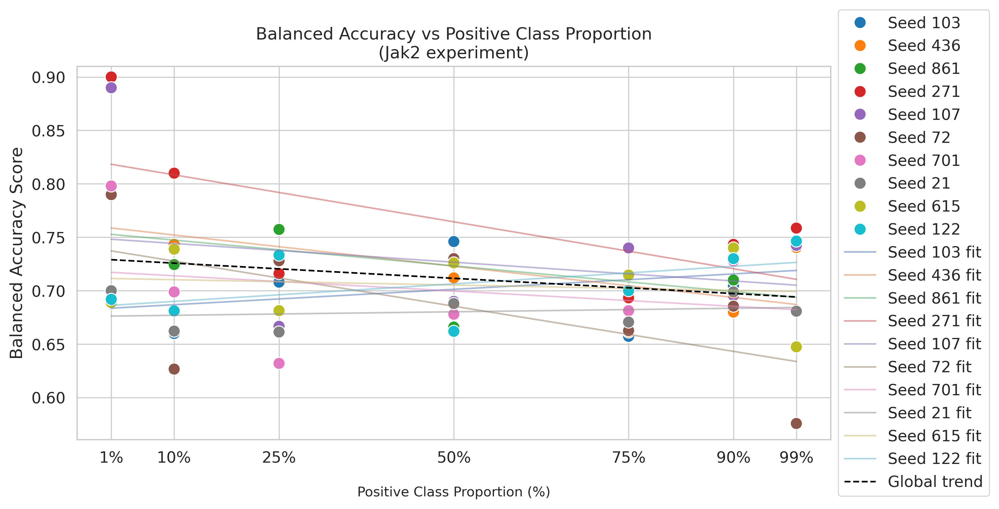

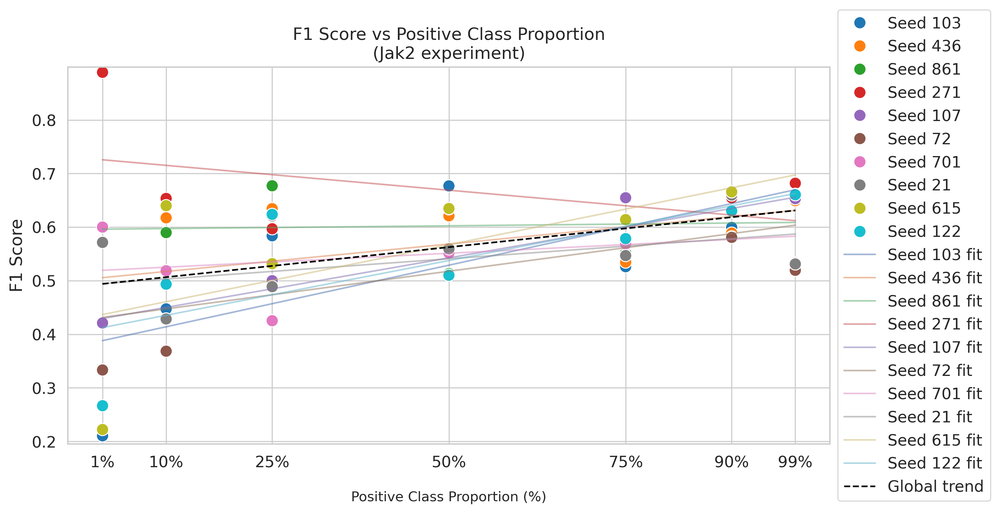

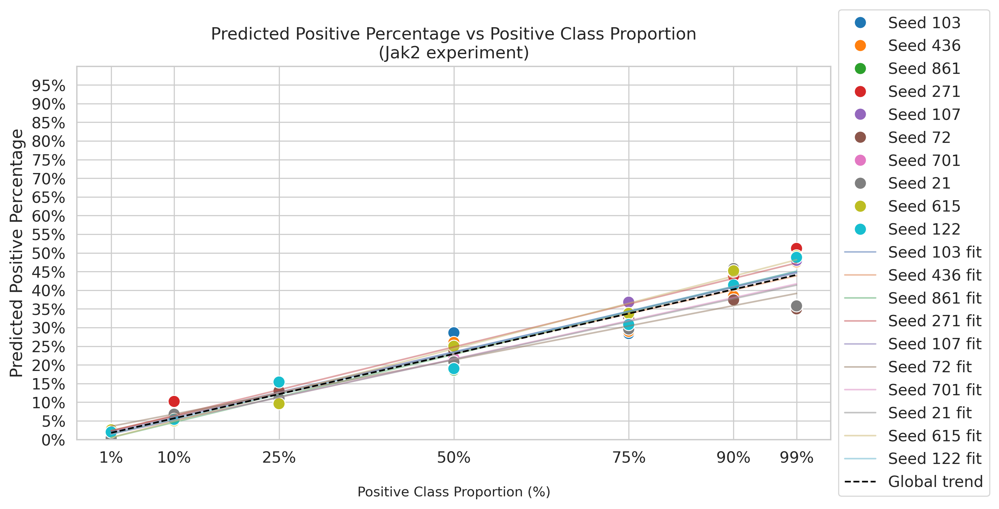

,Seed,Positive_Proportion,Balanced_Accuracy,F1_score,Predicted_Positive_Percentage
0,Seed 103,1.0,0.687879,0.210526,2.8
1,Seed 103,10.0,0.660000,0.447368,5.2
2,Seed 103,25.0,0.708000,0.583784,12.0
3,Seed 103,50.0,0.746000,0.676845,28.6
4,Seed 103,75.0,0.657333,0.526112,28.4
...,...,...,...,...,...
65,Seed 122,25.0,0.733333,0.623762,15.4
66,Seed 122,50.0,0.662000,0.510145,19.0
67,Seed 122,75.0,0.700000,0.578450,30.8
68,Seed 122,90.0,0.730000,0.630137,41.4


In [125]:
Experiment_Type = "Jak2 experiment"
run_multiple_seeds_and_plot(
    positive_files,
    negative_files,
    Experiment_Type,
    set_seed=20,
    #model_file="External_Test_before_final_conserve_model_BA_F1_CV/Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2/Test_0/Xgboost_Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2_SkImage_Jak2 experiment_with_External_Training_External_Test_before_final_conserve_model_Checkpoint.pkl",
    model_file = "External_Test_before_final_conserve_model_BA_F1_CV/Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2/Test_0/Xgboost_Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2_SkImage_Jak2 experiment_with_External_Training_Ch1_Ch5_Ch6_External_Test_before_final_conserve_model_Checkpoint.pkl",
    mock_base_dir="mock_datasets/",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch5", "Ch6"],
    threshold_mutation=0.5,
    output_path=f"mock_datasets/multi_seed_plot_{Experiment_Type}"
)

Running for threshold 0.2
Saved mock_datasets/AML experiment/mock_01_pos.csv with 5 positive and 495 negative samples.
Saved mock_datasets/AML experiment/mock_10_pos.csv with 50 positive and 450 negative samples.
Saved mock_datasets/AML experiment/mock_25_pos.csv with 125 positive and 375 negative samples.
Saved mock_datasets/AML experiment/mock_50_pos.csv with 250 positive and 250 negative samples.
Saved mock_datasets/AML experiment/mock_75_pos.csv with 375 positive and 125 negative samples.
Saved mock_datasets/AML experiment/mock_90_pos.csv with 450 positive and 50 negative samples.
Saved mock_datasets/AML experiment/mock_99_pos.csv with 495 positive and 5 negative samples.
Running for threshold 0.3
Saved mock_datasets/AML experiment/mock_01_pos.csv with 5 positive and 495 negative samples.
Saved mock_datasets/AML experiment/mock_10_pos.csv with 50 positive and 450 negative samples.
Saved mock_datasets/AML experiment/mock_25_pos.csv with 125 positive and 375 negative samples.
Saved m

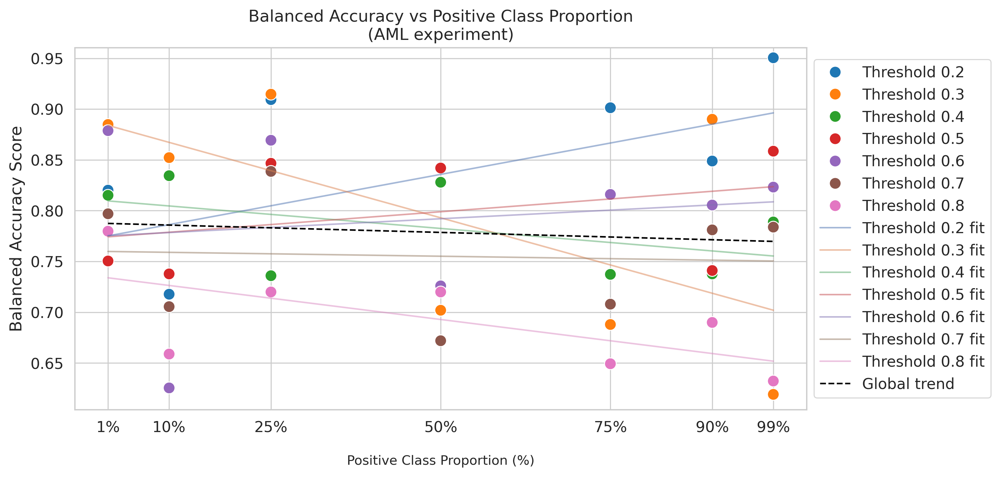

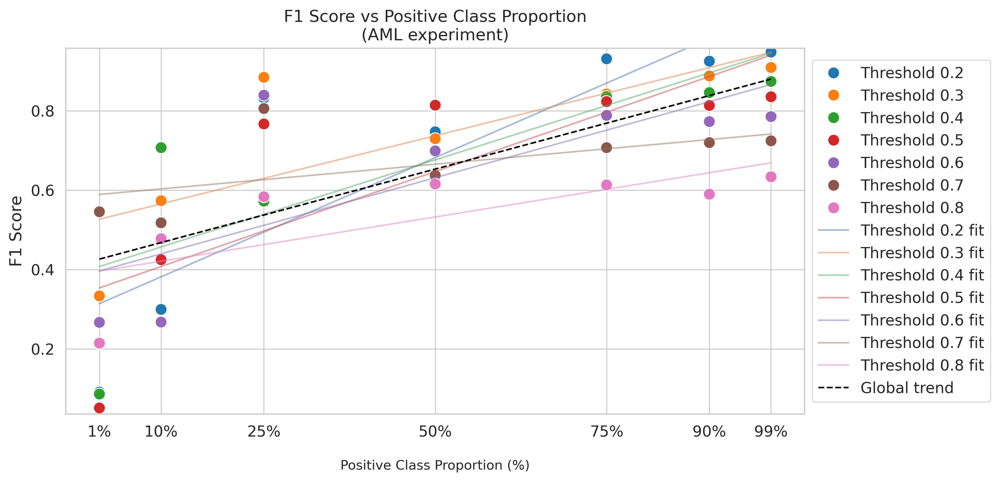

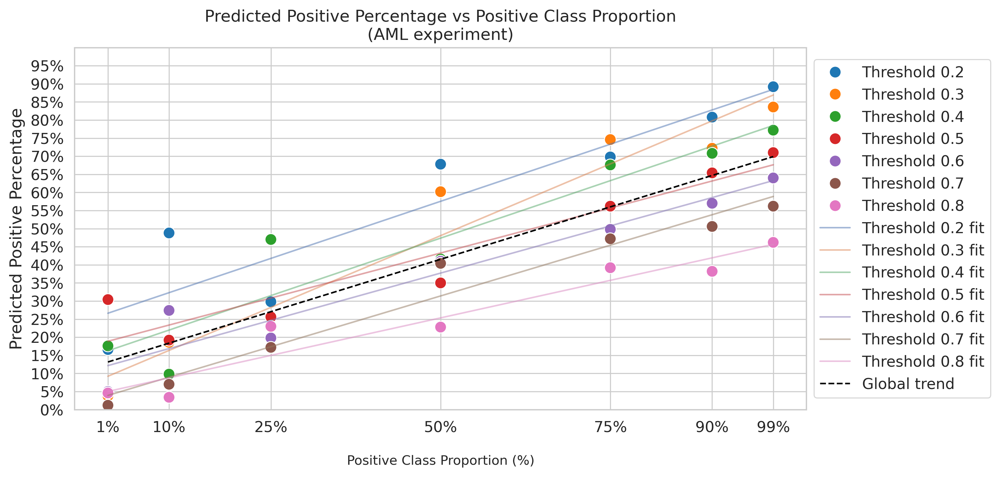

,Threshold,Positive_Proportion,Balanced_Accuracy,F1_score,Predicted_Positive_Percentage
0,Threshold 0.2,1.0,0.820202,0.090909,16.6
1,Threshold 0.2,10.0,0.717778,0.299320,48.8
2,Threshold 0.2,25.0,0.909333,0.832117,29.8
3,Threshold 0.2,50.0,0.702000,0.747029,67.8
4,Threshold 0.2,75.0,0.901333,0.930939,69.8
5,Threshold 0.2,90.0,0.848889,0.925059,80.8
6,Threshold 0.2,99.0,0.950505,0.947928,89.2
7,Threshold 0.3,1.0,0.884848,0.333333,3.8
8,Threshold 0.3,10.0,0.852222,0.573427,18.6
9,Threshold 0.3,25.0,0.914667,0.884298,23.4


In [126]:
Experiment_Type = "AML experiment"
run_multiple_threshold_and_plot(
    positive_files,
    negative_files,
    Experiment_Type,
    seed=271,
    model_file="External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV/Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14/Test_0/Xgboost_Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14_SkImage_AML experiment_with_External_Training_Ch1_Ch6_External_Test_before_final_conserve_model_Ch1_Ch6_Checkpoint.pkl",
    mock_base_dir="mock_datasets/",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch6"],
    threshold_mutations=[0.2,0.3,0.4,0.5,0.6,0.7,0.8],
    output_path=f"mock_datasets/multi_threshold_plot_{Experiment_Type}"
)

Running for threshold 0.2
Saved mock_datasets/Jak2 experiment/mock_01_pos.csv with 5 positive and 495 negative samples.
Saved mock_datasets/Jak2 experiment/mock_10_pos.csv with 50 positive and 450 negative samples.
Saved mock_datasets/Jak2 experiment/mock_25_pos.csv with 125 positive and 375 negative samples.
Saved mock_datasets/Jak2 experiment/mock_50_pos.csv with 250 positive and 250 negative samples.
Saved mock_datasets/Jak2 experiment/mock_75_pos.csv with 375 positive and 125 negative samples.
Saved mock_datasets/Jak2 experiment/mock_90_pos.csv with 450 positive and 50 negative samples.
Saved mock_datasets/Jak2 experiment/mock_99_pos.csv with 495 positive and 5 negative samples.
Running for threshold 0.3
Saved mock_datasets/Jak2 experiment/mock_01_pos.csv with 5 positive and 495 negative samples.
Saved mock_datasets/Jak2 experiment/mock_10_pos.csv with 50 positive and 450 negative samples.
Saved mock_datasets/Jak2 experiment/mock_25_pos.csv with 125 positive and 375 negative sample

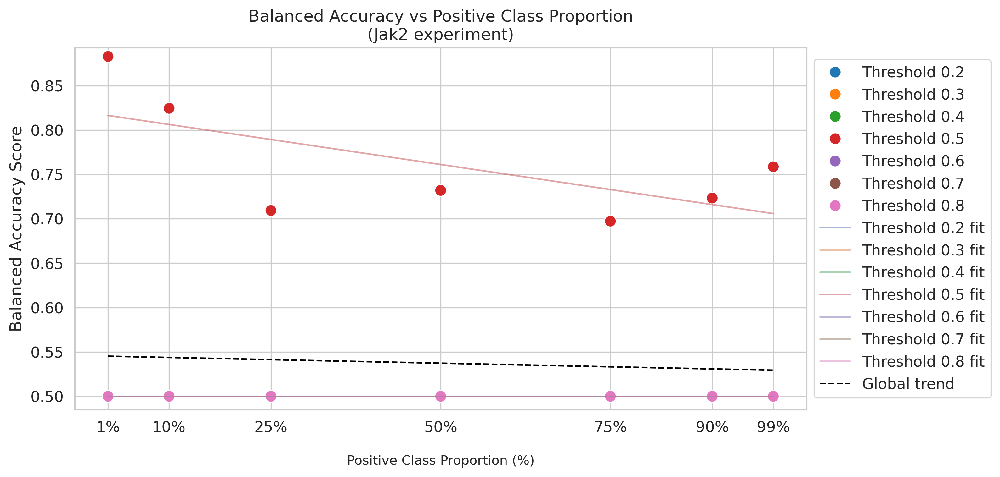

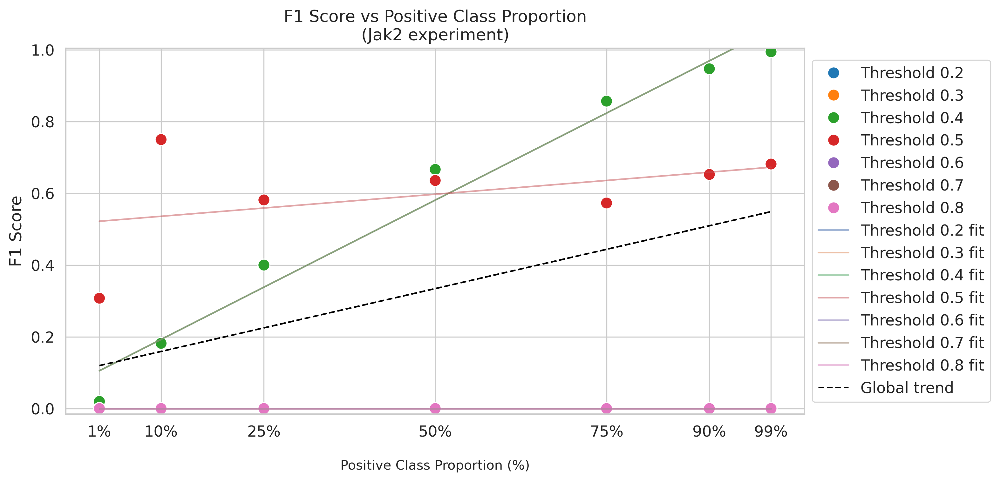

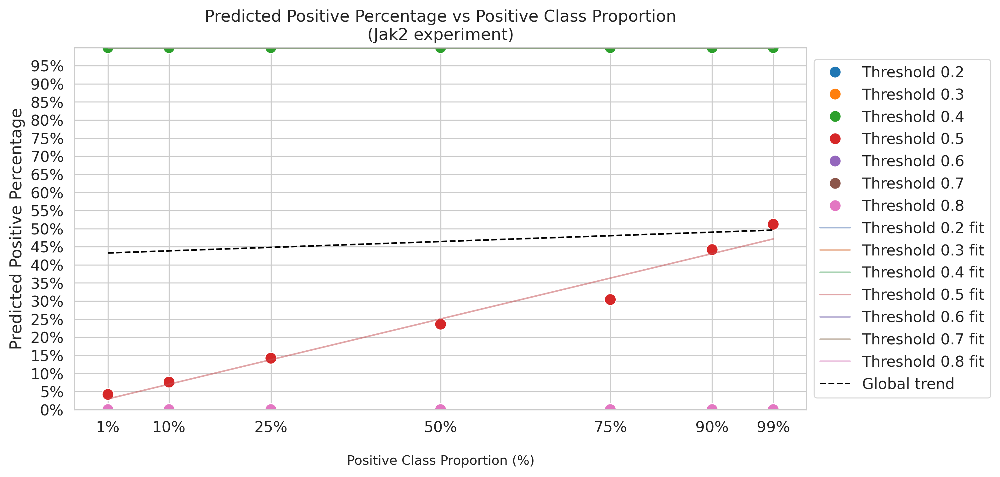

,Threshold,Positive_Proportion,Balanced_Accuracy,F1_score,Predicted_Positive_Percentage
0,Threshold 0.2,1.0,0.500000,0.019802,100.0
1,Threshold 0.2,10.0,0.500000,0.181818,100.0
2,Threshold 0.2,25.0,0.500000,0.400000,100.0
3,Threshold 0.2,50.0,0.500000,0.666667,100.0
4,Threshold 0.2,75.0,0.500000,0.857143,100.0
5,Threshold 0.2,90.0,0.500000,0.947368,100.0
6,Threshold 0.2,99.0,0.500000,0.994975,100.0
7,Threshold 0.3,1.0,0.500000,0.019802,100.0
8,Threshold 0.3,10.0,0.500000,0.181818,100.0
9,Threshold 0.3,25.0,0.500000,0.400000,100.0


In [127]:
Experiment_Type = "Jak2 experiment"
run_multiple_threshold_and_plot(
    positive_files,
    negative_files,
    Experiment_Type,
    seed=271,
    model_file = "External_Test_before_final_conserve_model_BA_F1_CV/Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2/Test_0/Xgboost_Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2_SkImage_Jak2 experiment_with_External_Training_Ch1_Ch5_Ch6_External_Test_before_final_conserve_model_Checkpoint.pkl",
    mock_base_dir="mock_datasets/",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch5", "Ch6"],
    threshold_mutations=[0.2,0.3,0.4,0.5,0.6,0.7,0.8],
    output_path=f"mock_datasets/multi_threshold_plot_{Experiment_Type}"
)

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick

def plot_band(full_df, Experiment_Type, output_path, metric, ylabel, file_suffix, is_percentage=False):
    """
    Band plot: mean ± std across seeds for a given metric.
    
    metric: str, one of ["Balanced_Accuracy", "F1_score", "Predicted_Positive_Percentage"]
    """
    # Aggregate by Positive_Proportion
    agg = (
        full_df
        .groupby("Positive_Proportion")[metric]
        .agg(["mean", "std"])
        .reset_index()
        .sort_values("Positive_Proportion")
    )
    
    x_vals = agg["Positive_Proportion"].values
    y_mean = agg["mean"].values
    y_std = agg["std"].values
    
    sns.set(style="whitegrid", context="paper", font_scale=1.3)
    plt.figure(figsize=(10, 6), dpi=600)

    # Band = mean ± std
    plt.fill_between(x_vals, y_mean - y_std, y_mean + y_std, 
                     alpha=0.3, label="±1 std. dev.")
    plt.plot(x_vals, y_mean, color="black", linewidth=2, label="Mean across seeds")

    plt.xlabel("\nPositive Class Proportion (%)", fontsize=10)
    plt.xticks(x_vals)
    plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:.0f}%'))

    plt.ylabel(ylabel)
    
    if is_percentage:
        plt.ylim(0, 100)
        plt.yticks(np.arange(0, 101, 5))
        plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f'{y:.0f}%'))
    else:
        plt.ylim(max(0, (y_mean - y_std).min() - 0.01), min(1, (y_mean + y_std).max() + 0.01))

    plt.title(f"{ylabel} vs Positive Class Proportion (Band)\n({Experiment_Type})")
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.subplots_adjust(top=0.8, right=0.8)

    plt.savefig(f"{output_path}_band_{file_suffix}.pdf", bbox_inches="tight")
    plt.show()


# Example calls after you run your full_df collection
# plot_band(full_df, Experiment_Type, output_path, "Balanced_Accuracy", "Balanced Accuracy Score", "balanced_accuracy")
# plot_band(full_df, Experiment_Type, output_path, "F1_score", "F1 Score", "f1score")
# plot_band(full_df, Experiment_Type, output_path, "Predicted_Positive_Percentage", "Predicted Positive Percentage", "predicted_positive_percentage", is_percentage=True)


In [9]:
import os
import pandas as pd
import pickle
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import balanced_accuracy_score, f1_score
import matplotlib.ticker as mtick

def run_multiple_seeds_and_band_plot(
    positive_files,
    negative_files,
    Experiment_Type,
    set_seed=42,
    model_file="...",
    mock_base_dir="mock_datasets/",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch6"],
    threshold_mutation=0.5,
    output_path="mock_datasets/multi_seed_plot"
):
    np.random.seed(set_seed)
    seeds = list(np.random.randint(1, 1000, size=10))

    def evaluate_mock_datasets_and_plot_single_seed(seed):
        # Create mock datasets for this seed
        create_mock_datasets(positive_files, negative_files, Experiment_Type, seed=seed)

        # Load model
        model = pickle.load(open(model_file, "rb"))
        feature_columns = model.get_booster().feature_names

        result_list = []
        mock_dir = os.path.join(mock_base_dir, Experiment_Type)

        for fname in sorted(os.listdir(mock_dir)):
            if not fname.endswith(".csv"):
                continue

            perc_str = fname.split("_")[1]
            perc_float = int(perc_str)
            fpath = os.path.join(mock_dir, fname)

            # Load and preprocess
            dataset = pd.read_csv(fpath, sep="\t")
            dataset = DataFrame_Channel_Based(data_type, dataset, all_channels, selected_channels)
            true_labels = dataset["Label"].astype(int)

            dataset_to_test = dataset[feature_columns]
            probabilities = model.predict_proba(dataset_to_test)
            predictions = (probabilities[:, 1] > threshold_mutation).astype(int)

            percentage_true = np.sum(predictions) / len(predictions) * 100
            score = balanced_accuracy_score(true_labels, predictions)
            F1 = f1_score(true_labels, predictions)

            result_list.append({
                "Seed": f"Seed {seed}",
                "Positive_Proportion": float(perc_float),
                "Balanced_Accuracy": score,
                "F1_score": F1,
                "Predicted_Positive_Percentage": percentage_true
            })

        return pd.DataFrame(result_list)

    # ---- Run for each seed
    all_dfs = []
    for seed in seeds:
        print(f"Running for seed {seed}")
        df_seed = evaluate_mock_datasets_and_plot_single_seed(seed)
        all_dfs.append(df_seed)

    full_df = pd.concat(all_dfs, ignore_index=True)

    # ---- Aggregate for envelope (min, median, max) per Positive_Proportion
    agg = (
        full_df
        .groupby("Positive_Proportion")
        .agg(
            ba_min=("Balanced_Accuracy", "min"),
            ba_med=("Balanced_Accuracy", "median"),
            ba_max=("Balanced_Accuracy", "max"),
            f1_min=("F1_score", "min"),
            f1_med=("F1_score", "median"),
            f1_max=("F1_score", "max"),
            pp_min=("Predicted_Positive_Percentage", "min"),
            pp_med=("Predicted_Positive_Percentage", "median"),
            pp_max=("Predicted_Positive_Percentage", "max"),
        )
        .reset_index()
        .sort_values("Positive_Proportion")
    )

    x_vals = agg["Positive_Proportion"].values

    # -----------------------------
    # Envelope: Balanced Accuracy
    # -----------------------------
    sns.set(style="whitegrid", context="paper", font_scale=1.3)
    plt.figure(figsize=(10, 6), dpi=300)

    plt.fill_between(
        x_vals, agg["ba_min"].values, agg["ba_max"].values,
        alpha=0.25, label="Seed envelope (min–max)"
    )
    plt.plot(x_vals, agg["ba_med"].values, linewidth=2, label="Median across seeds")

    plt.xlabel("\nPositive Class Proportion (%)", fontsize=10)
    plt.xticks(x_vals)
    plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:.0f}%'))
    plt.ylabel("Balanced Accuracy Score")
    y_min = min(agg["ba_min"].min(), 0.0)
    y_max = min(1.0, agg["ba_max"].max() + 0.01)
    plt.ylim(y_min - 0.01, y_max)
    plt.title(f"Balanced Accuracy vs Positive Class Proportion (Envelope)\n({Experiment_Type})")
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.subplots_adjust(top=0.8, right=0.8)
    plt.savefig(f"{output_path}_envelope_balanced_accuracy_vs_proportion.pdf", bbox_inches="tight")
    plt.show()

    # -----------------------------
    # Envelope: F1 Score
    # -----------------------------
    sns.set(style="whitegrid", context="paper", font_scale=1.3)
    plt.figure(figsize=(10, 6), dpi=600)

    plt.fill_between(
        x_vals, agg["f1_min"].values, agg["f1_max"].values,
        alpha=0.25, label="Seed envelope (min–max)"
    )
    plt.plot(x_vals, agg["f1_med"].values, linewidth=2, label="Median across seeds")

    plt.xlabel("\nPositive Class Proportion (%)", fontsize=10)
    plt.xticks(x_vals)
    plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:.0f}%'))
    plt.ylabel("F1 Score")
    y_min = max(0.0, agg["f1_min"].min() - 0.01)
    y_max = min(1.0, agg["f1_max"].max() + 0.01)
    plt.ylim(y_min, y_max)
    plt.title(f"F1 Score vs Positive Class Proportion (Envelope)\n({Experiment_Type})")
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.subplots_adjust(top=0.8, right=0.8)
    plt.savefig(f"{output_path}_envelope_f1score_vs_proportion.pdf", bbox_inches="tight")
    plt.show()

    # -----------------------------
    # Envelope: Predicted Positive %
    # -----------------------------
    sns.set(style="whitegrid", context="paper", font_scale=1.3)
    plt.figure(figsize=(10, 6), dpi=600)

    plt.fill_between(
        x_vals, agg["pp_min"].values, agg["pp_max"].values,
        alpha=0.25, label="Seed envelope (min–max)"
    )
    plt.plot(x_vals, agg["pp_med"].values, linewidth=2, label="Median across seeds")

    plt.xlabel("\nPositive Class Proportion (%)", fontsize=10)
    plt.xticks(x_vals)
    plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:.0f}%'))
    plt.ylabel("Predicted Positive Percentage")
    plt.ylim(0, 100)
    plt.yticks(np.arange(0, 101, 5))
    plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f'{y:.0f}%'))
    plt.title(f"Predicted Positive % vs Positive Class Proportion (Envelope)\n({Experiment_Type})")
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.subplots_adjust(top=0.8, right=0.8)
    plt.savefig(f"{output_path}_envelope_predicted_positive_percentage_vs_proportion.pdf", bbox_inches="tight")
    plt.show()

    return full_df, agg


In [12]:
# Example usage
# Assuming files:
positive_files = [
    "Properties_Table_CIF_3_PDX1-Mouse2_10_hCD45.csv", 
    "Properties_Table_CIF_3_PDX1-Mouse2_11_R3 & R2 & R1_hCD45.csv",
    "Properties_Table_CIF_3_PDX2-Mouse3_7_hCD45.csv",
]
negative_files = [
    "Properties_Table_CIF_5_Healthy FHCC donor 1.csv",
    "Properties_Table_CIF_11_MCW donor 001 re-capture at FHCC.csv", 
    "Properties_Table_CIF_5_Healthy UKHD donor 1.csv",
    "Properties_Table_CIF_Human.csv"]


In [11]:
Experiment_Type = "AML experiment"

Running for seed 356
Saved mock_datasets/AML experiment/mock_01_pos.csv with 5 positive and 495 negative samples.
Saved mock_datasets/AML experiment/mock_10_pos.csv with 50 positive and 450 negative samples.
Saved mock_datasets/AML experiment/mock_25_pos.csv with 125 positive and 375 negative samples.
Saved mock_datasets/AML experiment/mock_50_pos.csv with 250 positive and 250 negative samples.
Saved mock_datasets/AML experiment/mock_75_pos.csv with 375 positive and 125 negative samples.
Saved mock_datasets/AML experiment/mock_90_pos.csv with 450 positive and 50 negative samples.
Saved mock_datasets/AML experiment/mock_99_pos.csv with 495 positive and 5 negative samples.
Running for seed 475
Saved mock_datasets/AML experiment/mock_01_pos.csv with 5 positive and 495 negative samples.
Saved mock_datasets/AML experiment/mock_10_pos.csv with 50 positive and 450 negative samples.
Saved mock_datasets/AML experiment/mock_25_pos.csv with 125 positive and 375 negative samples.
Saved mock_datase

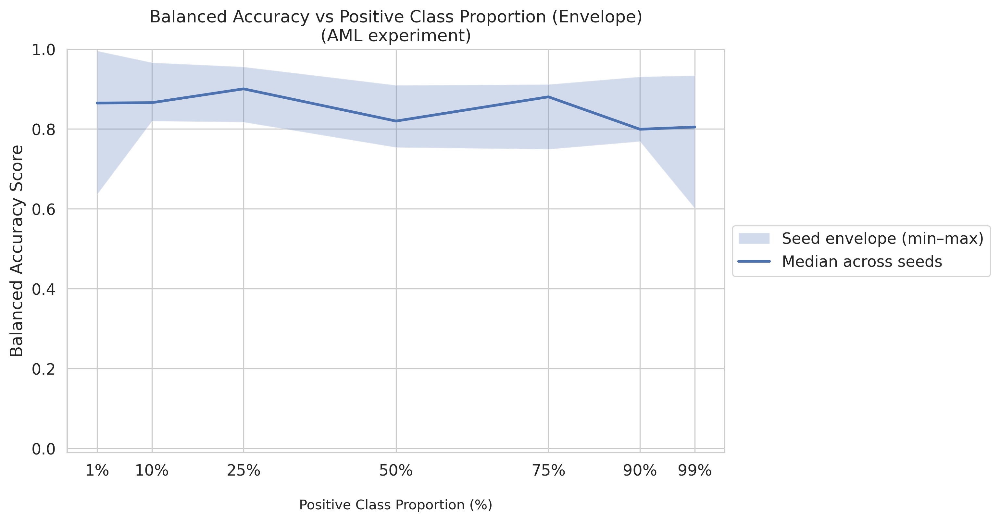

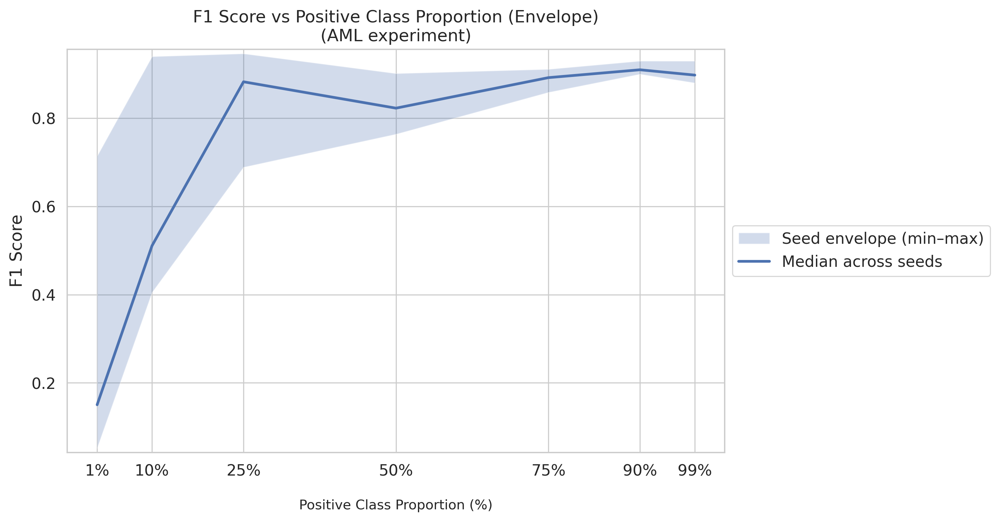

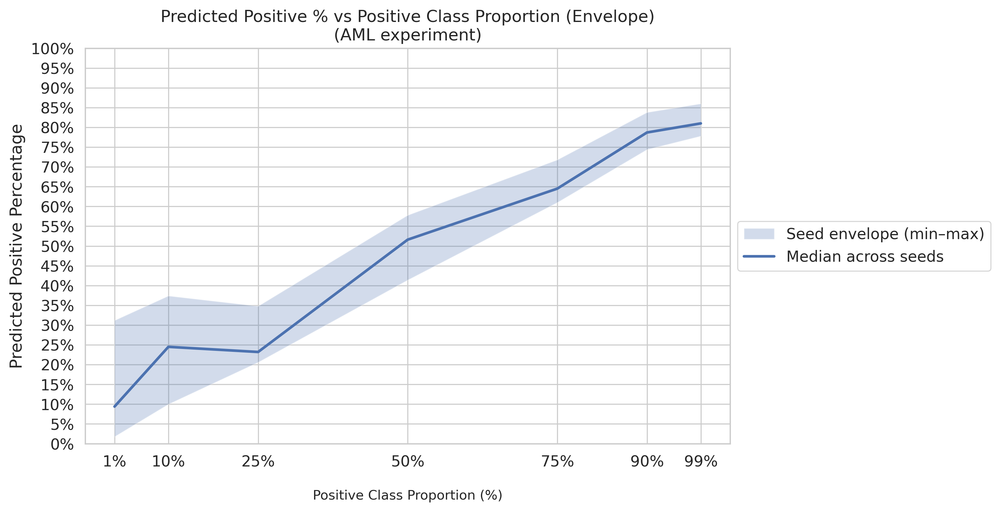

(        Seed  Positive_Proportion  Balanced_Accuracy  F1_score  \
 0   Seed 356                  1.0           0.874747  0.235294   
 1   Seed 356                 10.0           0.885556  0.507772   
 2   Seed 356                 25.0           0.900000  0.882096   
 3   Seed 356                 50.0           0.764000  0.775665   
 4   Seed 356                 75.0           0.908000  0.902190   
 ..       ...                  ...                ...       ...   
 65  Seed 791                 25.0           0.940000  0.928870   
 66  Seed 791                 50.0           0.796000  0.804598   
 67  Seed 791                 75.0           0.886667  0.901004   
 68  Seed 791                 90.0           0.768889  0.916473   
 69  Seed 791                 99.0           0.917172  0.909692   
 
     Predicted_Positive_Percentage  
 0                             5.8  
 1                            28.6  
 2                            20.8  
 3                            55.2  
 4       

In [10]:
run_multiple_seeds_and_band_plot(
    positive_files,
    negative_files,
    Experiment_Type,
    set_seed=20,
    model_file="External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV/Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14/Test_0/Xgboost_Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14_SkImage_AML experiment_with_External_Training_Ch1_Ch6_External_Test_before_final_conserve_model_Ch1_Ch6_Checkpoint.pkl",
    mock_base_dir="mock_datasets/",
    data_type="SkImage",
    all_channels=["Ch1", "Ch5", "Ch6"],
    selected_channels=["Ch1", "Ch6"],
    threshold_mutation=0.5,
    output_path=f"mock_datasets/multi_seed_plot_{Experiment_Type}"
)

In [96]:
model_file = "External_Test_before_final_conserve_model_BA_F1_CV/Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2/Test_0/Xgboost_Run_CP_Jak2_SkI_CP_Ext_Tr_FHCC2_Cell_Profiler_Jak2 experiment_with_External_Training_Ch1_Ch5_Ch6_External_Test_before_final_conserve_model_Checkpoint.pkl"

In [97]:
os.path.exists(model_file)

True

In [98]:
# Example usage
# Assuming files:
positive_files = [
    "Properties_Table_CIF_3_JAK2-GZ01_9_R3&R2&R1.csv", 
    "Properties_Table_CIF_3_JAK2-GZ01_8_R2&R1.csv",
    "Properties_Table_CIF_10_JAK2-GZ02_1_R4&R3&R2&R1.csv",
    "Properties_Table_CIF_10_JAK2-GZ03_1_R2&R1.csv"
]
negative_files = [
    "Properties_Table_CIF_5_Healthy FHCC donor 1.csv",
    "Properties_Table_CIF_11_MCW donor 001 re-capture at FHCC.csv", 
    "Properties_Table_CIF_5_Healthy UKHD donor 1.csv",
    "Properties_Table_CIF_Human.csv"]


In [100]:
# Example usage
# Assuming files:
positive_files = [
    "Cell_Profiler_Features_Metadata/Human JAK2+ patient samples/JAK2-GZ01_9_R3&R2&R1/BF_cells_on_grid.csv", 
    "Cell_Profiler_Features_Metadata/Human JAK2+ patient samples/JAK2-GZ01_8_R2&R1/BF_cells_on_grid.csv",
    "Cell_Profiler_Features_Metadata/Human JAK2+ patient samples/JAK2-GZ02_1_R4&R3&R2&R1/BF_cells_on_grid.csv",
    "Cell_Profiler_Features_Metadata/Human JAK2+ patient samples/JAK2-GZ03_1_R2&R1/BF_cells_on_grid.csv"
]
negative_files = [
    "Cell_Profiler_Features_Metadata/Human normal donors/Healthy FHCC donor 1/BF_cells_on_grid.csv",
    "Cell_Profiler_Features_Metadata/Human normal donors/MCW donor 001 re-capture at FHCC/BF_cells_on_grid.csv", 
    "Cell_Profiler_Features_Metadata/Human normal donors/Healthy UKHD donor 1/BF_cells_on_grid.csv",
    "Cell_Profiler_Features_Metadata/Human normal donors/Healthy UKHD donor 2/BF_cells_on_grid.csv"]


In [101]:
all_files = positive_files + negative_files

In [102]:
# Load model
#model = pickle.load(open(model_file, "rb"))
model = pickle.load(open(model_file, "rb"))
feature_columns = model.get_booster().feature_names

In [103]:
results_dict = {}
thresholds = [0.4,0.5,0.6]
for each_threshold in thresholds:
    results_dict[each_threshold] = {}
    for each_file in all_files:
        #file = pd.read_csv(each_file, delimiter="\t")
        file = pd.read_csv(each_file, delimiter=",", skiprows = 1)
        probabilities = model.predict_proba(file[feature_columns])
        prediction = [i.astype(int) for i in (probabilities[:,1]>each_threshold)]
        results_dict[each_threshold][each_file] = (sum(prediction)/len(prediction))*100

In [104]:
results_dict

{0.4: {'Cell_Profiler_Features_Metadata/Human JAK2+ patient samples/JAK2-GZ01_9_R3&R2&R1/BF_cells_on_grid.csv': 2.376237623762376,
  'Cell_Profiler_Features_Metadata/Human JAK2+ patient samples/JAK2-GZ01_8_R2&R1/BF_cells_on_grid.csv': 1.084010840108401,
  'Cell_Profiler_Features_Metadata/Human JAK2+ patient samples/JAK2-GZ02_1_R4&R3&R2&R1/BF_cells_on_grid.csv': 0.09285051067780872,
  'Cell_Profiler_Features_Metadata/Human JAK2+ patient samples/JAK2-GZ03_1_R2&R1/BF_cells_on_grid.csv': 0.0,
  'Cell_Profiler_Features_Metadata/Human normal donors/Healthy FHCC donor 1/BF_cells_on_grid.csv': 0.6302521008403361,
  'Cell_Profiler_Features_Metadata/Human normal donors/MCW donor 001 re-capture at FHCC/BF_cells_on_grid.csv': 0.0,
  'Cell_Profiler_Features_Metadata/Human normal donors/Healthy UKHD donor 1/BF_cells_on_grid.csv': 0.5272407732864675,
  'Cell_Profiler_Features_Metadata/Human normal donors/Healthy UKHD donor 2/BF_cells_on_grid.csv': 0.0},
 0.5: {'Cell_Profiler_Features_Metadata/Human J

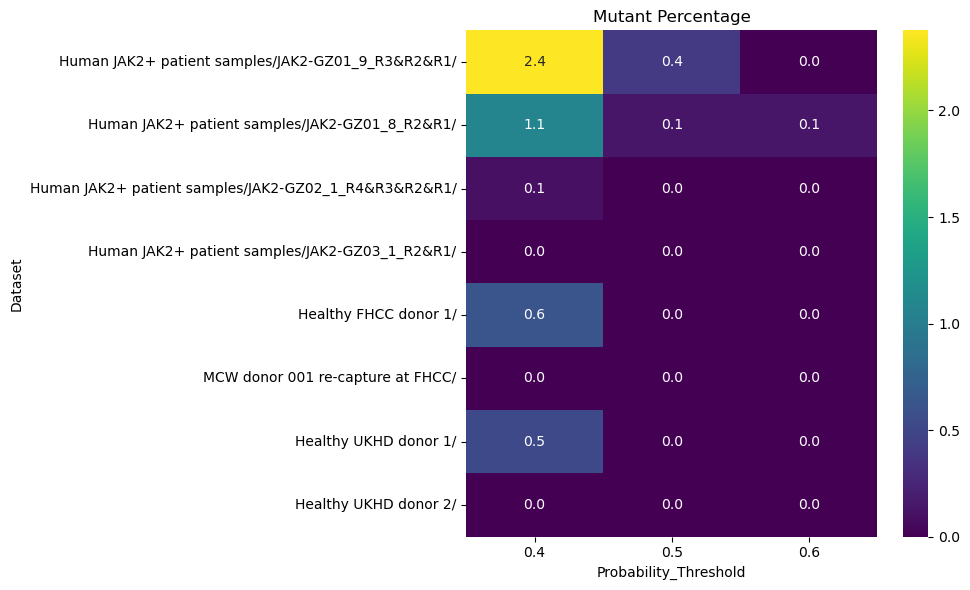

In [105]:
# Convert to DataFrame
df = pd.DataFrame(results_dict)

# Clean the keys: remove prefix and .csv
df.index = df.index.str.replace(r'^Properties_Table_CIF(_\d+)?_', '', regex=True)
df.index = df.index.str.replace('.csv$', '', regex=True)
df.index = df.index.str.replace('BF_cells_on_grid', '', regex=True)
df.index = df.index.str.replace('Cell_Profiler_Features_Metadata/', '', regex=True)
df.index = df.index.str.replace('Human JAK2+ patient samples/', '', regex=True)
df.index = df.index.str.replace('Human normal donors/', '', regex=True)

# Plot
plt.figure(figsize=(10, 6))
sns.heatmap(df, annot=True, fmt=".1f", cmap="viridis")
plt.title("Mutant Percentage")
plt.xlabel("Probability_Threshold")
plt.ylabel("Dataset")
plt.tight_layout()
plt.savefig(f"./Saved_PDFs/Threshold_percentage_Jak2_Cell_Profiler_Ch1_Ch5_Ch6.pdf", bbox_inches="tight")
plt.show()

In [10]:
# Example usage
# Assuming files:
positive_files = [
    "Properties_Table_CIF_3_PDX1-Mouse2_10_hCD45.csv", 
    "Properties_Table_CIF_3_PDX1-Mouse2_11_R3 & R2 & R1_hCD45.csv",
    "Properties_Table_CIF_3_PDX2-Mouse3_7_hCD45.csv"
    
]
negative_files = [
    "Properties_Table_CIF_5_Healthy FHCC donor 1.csv",
    "Properties_Table_CIF_11_MCW donor 001 re-capture at FHCC.csv", 
    "Properties_Table_CIF_5_Healthy UKHD donor 1.csv",
    "Properties_Table_CIF_Human.csv"]


In [15]:
# Example usage
# Assuming files:
positive_files = [
    "Cell_Profiler_Features_Metadata/Human AML patient samples/PDX1-Mouse2_10_hCD45/BF_cells_on_grid.csv", 
    "Cell_Profiler_Features_Metadata/Human AML patient samples/PDX1-Mouse2_11_R3 & R2 & R1_hCD45/BF_cells_on_grid.csv",
    "Cell_Profiler_Features_Metadata/Human AML patient samples/PDX2-Mouse3_7_hCD45/BF_cells_on_grid.csv",
    "Cell_Profiler_Features_Metadata/Human AML patient samples/PDX1-Mouse1_4_hCD45/BF_cells_on_grid.csv"
]
negative_files = [
    "Cell_Profiler_Features_Metadata/Human normal donors/Healthy FHCC donor 2/BF_cells_on_grid.csv",
    "Cell_Profiler_Features_Metadata/Human normal donors/Healthy FHCC donor 1/BF_cells_on_grid.csv",
    "Cell_Profiler_Features_Metadata/Human normal donors/MCW donor 001 re-capture at FHCC/BF_cells_on_grid.csv", 
    "Cell_Profiler_Features_Metadata/Human normal donors/Healthy UKHD donor 1/BF_cells_on_grid.csv",
    "Cell_Profiler_Features_Metadata/Human normal donors/Healthy UKHD donor 2/BF_cells_on_grid.csv"]


In [23]:
import os
import re
import pickle
from io import BytesIO
from typing import Optional

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.backends.backend_pdf import PdfPages
from PIL import Image
import shap
from sklearn.metrics import roc_curve, auc

# ------------------------------
# Global export preferences
# ------------------------------
FINAL_DPI = 300      # DPI for final PDF pages (the outer figure)
SHAP_DPI  = 900      # DPI for off-screen SHAP renders (600–1200 typical)
DEFAULT_FONT_SIZE = 12

plt.rcParams.update({
    "figure.dpi": 150,       # on-screen clarity
    "savefig.dpi": FINAL_DPI,
    "pdf.fonttype": 42,      # keep text editable
    "ps.fonttype": 42,
    "font.size": DEFAULT_FONT_SIZE,
})

# ------------------------------
# Helpers you already had (kept)
# ------------------------------
def get_features_set(model_file):
    if ("Cell Profiler" in model_file) or ("Cell_Profiler" in model_file):
        features_set = "Cell_Profiler"
    elif "SkImage" in model_file:
        features_set = "SkImage"
    elif "Pyfeats" in model_file:
        features_set = "Pyfeats"
    else:
        features_set = "All"
    return features_set

def to_int_or_none(s):
    try:
        return int(s)
    except ValueError:
        return None

def get_experiment_name(path_or_name: str, given_experiment_name: Optional[str] = None) -> str:
    """
    If given_experiment_name is provided, return it.
    Otherwise, try to extract an experiment block like:
    AML_SkI_CP_Ext_Tr_FHCC2_M14_Ch1_Ch6
    JAK2_SkI_CP_XYZ_M02
    CML_CP_ABC_M21
    """
    if given_experiment_name and given_experiment_name.strip():
        return given_experiment_name.strip()

    text = str(path_or_name)

    # Core pattern:
    #   (disease/study tokens) + (dataset) + (Mxx) + (optional channels)
    pattern = r'([A-Za-z0-9_]+_[A-Za-z0-9]+_M\d+(?:_Ch\d+)*)'

    match = re.search(pattern, text)
    if match:
        return match.group(1)

    # fallback: use filename without extension
    base = os.path.basename(text)
    return re.sub(r'\.[A-Za-z0-9]+$', '', base)

# ------------------------------
# New helper: render SHAP panel
# ------------------------------
def render_shap_image(
    shap_values,
    X: pd.DataFrame,
    feature_names,
    width_in: float,
    height_in: float,
    dpi: int = SHAP_DPI,
    suptitle: Optional[str] = None
) -> np.ndarray:
    """
    Render a SHAP summary plot off-screen at a known physical size (inches),
    and return it as a NumPy array for pasting via imshow without resampling.
    """
    fig = plt.figure(figsize=(width_in, height_in), dpi=dpi)
    if suptitle:
        plt.suptitle(suptitle, y=1.02, fontsize=14)
    shap.summary_plot(
        shap_values,
        X,
        feature_names=feature_names,
        show=False
    )
    plt.tight_layout()

    buf = BytesIO()
    fig.savefig(buf, format='png', dpi=dpi, bbox_inches='tight', facecolor='white')
    plt.close(fig)
    buf.seek(0)
    return np.array(Image.open(buf))

# ------------------------------
# Main plotting function (edited)
# ------------------------------
def shap_plots_TF(positive_files, negative_files, model_file, Channel_annotating_dict, dataset_type, pdf=None):
    """
    Keeps your original composition:
      - A 1x2 montage for Prediction 0/1 (each a SHAP summary)
      - A ROC page
      - A 2x2 montage for TP/TN/FP/FN (each a SHAP summary)
    But renders each SHAP panel off-screen at fixed size & high DPI,
    and pastes it without resampling for crisp output.
    """

    def execute_plottings():
        # Ensure compatibility with newer numpy
        np.int = int

        # Derive a clean name (your original logic)
        match = re.search(r'(AML_SkI_CP_Ext_Tr_[^_]+_\d+(?:_Ch\d+)*)', model_file)
        if match:
            clean_name = match.group(1)
        else:
            clean_name = model_file  # fallback
        print(clean_name)

        features_set_local = get_features_set(model_file)

        combined_files = positive_files + negative_files

        # Load model
        model = pickle.load(open(model_file, "rb"))
        # Try to get feature names robustly
        try:
            feature_columns = model.get_booster().feature_names
            if feature_columns is None:
                # fallback when using sklearn wrapper
                feature_columns = list(getattr(model, 'feature_names_in_', []))
        except Exception:
            feature_columns = list(getattr(model, 'feature_names_in_', []))
        if not feature_columns:
            raise ValueError("Feature names could not be determined from model.")

        # SHAP explainer (TreeExplainer works for XGBoost)
        explainer = shap.TreeExplainer(model)

        combined_files_for_result_Test_X = []
        combined_files_for_result_Test_y = []

        for file in combined_files:
            label = 1 if file in positive_files else 0

            # Detect file type based on features set
            features_set_detected = "Cell_Profiler" if "Cell_Profiler" in features_set_local else "Other"
            if features_set_local == "Cell_Profiler":
                dataset = pd.read_csv(file, delimiter=",", skiprows=1)
            else:
                dataset = pd.read_csv(file, delimiter="\t")

            file_name = file
            # Clean up displayed name
            file_name = re.sub(r'^Properties_Table_CIF(_\d+)?_', '', file_name)  # regex for prefix
            file_name = re.sub(r'\.csv$', '', file_name)                          # regex for suffix
            file_name = file_name.replace('BF_cells_on_grid', '')
            file_name = file_name.replace('Cell_Profiler_Features_Metadata/', '')
            file_name = file_name.replace('Human JAK2+ patient samples/', '')
            file_name = file_name.replace('Human normal donors/', '')

            # Select model-required features
            Test_X = dataset[feature_columns].copy()
            Test_y = pd.DataFrame([label] * len(Test_X)).reset_index(drop=True)
            Test_y.columns = ["Label"]

            combined_files_for_result_Test_X.append(Test_X)
            combined_files_for_result_Test_y.append(Test_y)

            # Annotate feature names
            Channel_annotating_keys_list = list(Channel_annotating_dict.keys())
            Test_X_columns_list = []
            for col in Test_X.columns:
                if dataset_type == "Cell_Profiler":
                    for old, new in Channel_annotating_dict.items():
                        col = col.replace(old, new)
                else:
                    if "." in col:
                        col_sep = to_int_or_none(col.split(".")[-1])
                        if not col_sep:
                            col = f"{col}_{Channel_annotating_dict[Channel_annotating_keys_list[0]]}"
                        elif col_sep in range(1, 3):
                            to_replace = f".{col_sep}"
                            replacement = f"_{Channel_annotating_dict[Channel_annotating_keys_list[col_sep]]}"
                            before, match_sep, after = col.rpartition(to_replace)
                            col = before + replacement + after
                        else:
                            col = f"{col}_{Channel_annotating_dict[Channel_annotating_keys_list[0]]}"
                    else:
                        col = f"{col}_{Channel_annotating_dict[Channel_annotating_keys_list[0]]}"
                Test_X_columns_list.append(col)

            # Predictions/probabilities
            preds = model.predict(Test_X)
            probs = model.predict_proba(Test_X)

            # Subsets for class-wise prediction analysis
            preds_df = pd.DataFrame(preds, columns=["Label"])
            negatives_preds = Test_X[preds_df["Label"] == 0].reset_index(drop=True)
            positives_preds = Test_X[preds_df["Label"] == 1].reset_index(drop=True)

            # ---- SHAP Summary Plots for Prediction 0 and 1 (as montage) ----
            neg_pos_dict = {
                f"Prediction-0": negatives_preds,
                f"Prediction-1": positives_preds
            }

            # Keep your outer layout size; set per-panel physical size to match
            fig, axes = plt.subplots(1, 2, figsize=(20, 15))
            axes = axes.flatten()
            panel_w_in, panel_h_in = 9.0, 13.0  # fine-tuned to fit inside 20x15 with margins

            for i, (title, subset_X) in enumerate(neg_pos_dict.items()):
                ax = axes[i]
                ax.set_title(title, fontsize=14)
                ax.axis('off')

                subset_X = subset_X.reset_index(drop=True)
                if subset_X.empty:
                    ax.set_title(f"{title} (No samples)", fontsize=14)
                    continue

                shap_values = explainer(subset_X)
                img = render_shap_image(
                    shap_values, subset_X,
                    feature_names=Test_X_columns_list,
                    width_in=panel_w_in, height_in=panel_h_in,
                    dpi=SHAP_DPI,
                    suptitle=f"{title}\n{file_name}"
                )
                ax.imshow(img, interpolation='none', resample=False)
                ax.set_xticks([]); ax.set_yticks([])

            fig.suptitle(f"\nSHAP Summary Plots (Predicted Classes)\n{file_name}\n", fontsize=16)
            plt.tight_layout(rect=[0, 0.03, 1, 1])
            if pdf is not None:
                pdf.savefig(fig, dpi=FINAL_DPI)
            plt.show()
            plt.close(fig)

        # ----- Combine all for ROC & error-type subsets -----
        Test_X = pd.concat(combined_files_for_result_Test_X).reset_index(drop=True)
        Test_y = pd.concat(combined_files_for_result_Test_y).reset_index(drop=True)
        preds = model.predict(Test_X)
        probs = model.predict_proba(Test_X)

        # ROC Curve
        fpr, tpr, _ = roc_curve(Test_y["Label"], probs[:, 1])
        roc_auc = auc(fpr, tpr)

        fig_roc, ax_roc = plt.subplots(figsize=(7, 6))
        ax_roc.plot(fpr, tpr, lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        ax_roc.plot([0, 1], [0, 1], lw=2, linestyle='--')
        ax_roc.set_xlim([0.0, 1.0]); ax_roc.set_ylim([0.0, 1.05])
        ax_roc.set_xlabel('False Positive Rate'); ax_roc.set_ylabel('True Positive Rate')
        ax_roc.set_title(f'AUROC - {get_experiment_name(model_file, dataset_type)}')
        ax_roc.legend(loc='lower right'); ax_roc.grid(True)
        plt.tight_layout(rect=[0, 0.03, 1, 1])
        if pdf is not None:
            pdf.savefig(fig_roc, dpi=FINAL_DPI)
        plt.show()
        plt.close(fig_roc)

        # Error-type subsets
        preds_df = pd.DataFrame(preds)
        negatives = Test_X[Test_y["Label"] == 0].reset_index(drop=True)
        positives = Test_X[Test_y["Label"] == 1].reset_index(drop=True)
        negatives_preds = preds_df[Test_y["Label"] == 0].reset_index(drop=True)
        positives_preds = preds_df[Test_y["Label"] == 1].reset_index(drop=True)

        subsets = {
            f"True Negatives - instances ({len(negatives[negatives_preds[0] == 0])})": negatives[negatives_preds[0] == 0],
            f"False Positives - instances ({len(negatives[negatives_preds[0] == 1])})": negatives[negatives_preds[0] == 1],
            f"False Negatives - instances ({len(positives[positives_preds[0] == 0])})": positives[positives_preds[0] == 0],
            f"True Positives - instances ({len(positives[positives_preds[0] == 1])})": positives[positives_preds[0] == 1]
        }

        # ---- SHAP Summary Plots for TP/TN/FP/FN (as 2x2 montage) ----
        fig, axes = plt.subplots(2, 2, figsize=(20, 15))
        axes = axes.flatten()
        panel_w_in, panel_h_in = 9.0, 6.0  # tuned for 2x2 within 20x15

        for i, (title, subset_X) in enumerate(subsets.items()):
            ax = axes[i]
            ax.set_title(title, fontsize=14)
            ax.axis('off')

            subset_X = subset_X.reset_index(drop=True)
            if subset_X.empty:
                ax.set_title(f"{title} (No samples)", fontsize=14)
                continue

            shap_values = explainer(subset_X)
            img = render_shap_image(
                shap_values, subset_X,
                feature_names=Test_X_columns_list,
                width_in=panel_w_in, height_in=panel_h_in,
                dpi=SHAP_DPI,
                suptitle=title
            )
            ax.imshow(img, interpolation='none', resample=False)
            ax.set_xticks([]); ax.set_yticks([])

        fig.suptitle(f"\nSHAP Summary Plots (TP/TN/FP/FN)\n{get_experiment_name(model_file, dataset_type)}\n", fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 1])
        if pdf is not None:
            pdf.savefig(fig, dpi=FINAL_DPI)
        plt.show()
        plt.close(fig)

    # ---- PdfPages handling ----
    if not pdf:
        execute_plottings()
    else:
        os.makedirs(pdf, exist_ok=True)
        features_set = get_features_set(model_file)
        out_path = os.path.join(pdf, f'Features_Test_{dataset_type}_{features_set}.pdf')
        with PdfPages(out_path) as pdf:
            execute_plottings()


In [24]:
dataset_type = "AML experiment"

In [25]:
Channel_annotationg_dict = {"Ch1": "BF", "Ch5":"Nucleus", "Ch6":"DF"}

External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV/Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14/Test_0/Xgboost_Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14_SkImage_AML experiment_with_External_Training_Ch1_Ch6_External_Test_before_final_conserve_model_Ch1_Ch6_Checkpoint.pkl


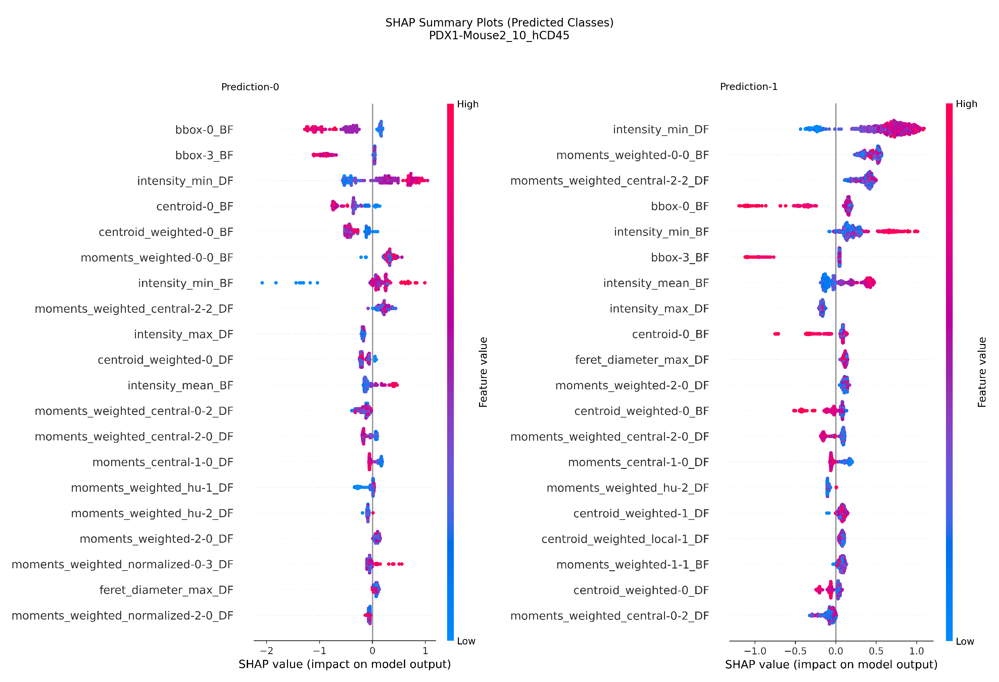

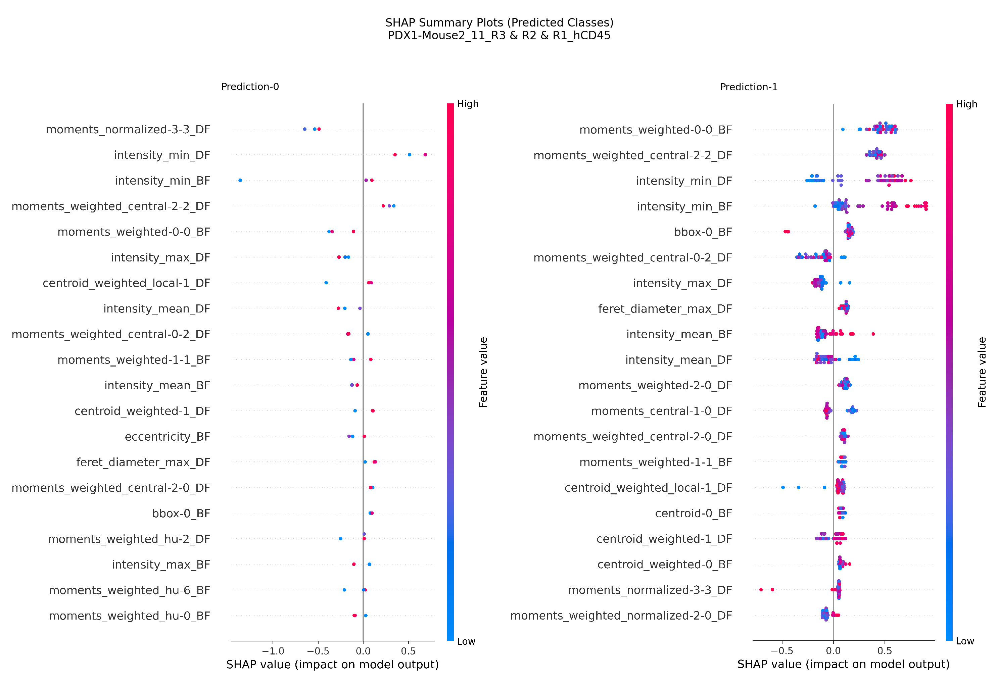

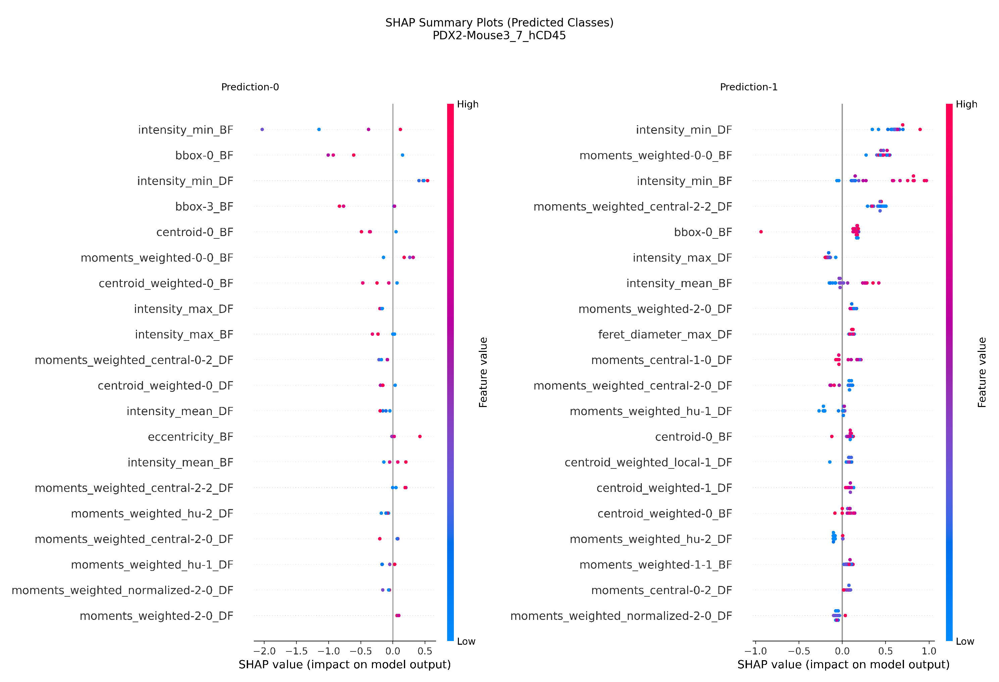

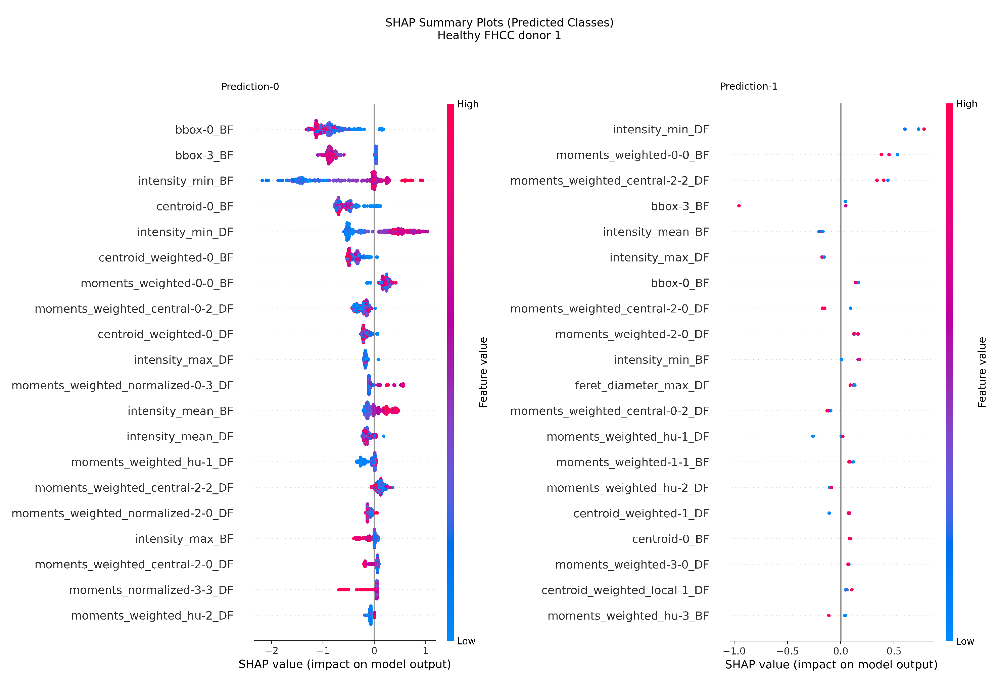

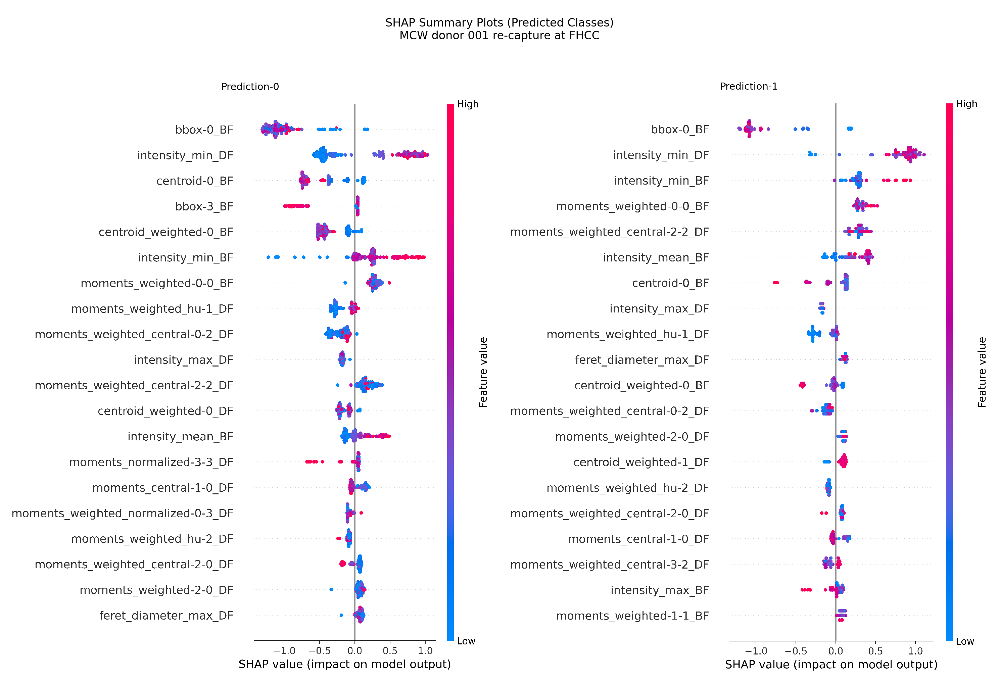

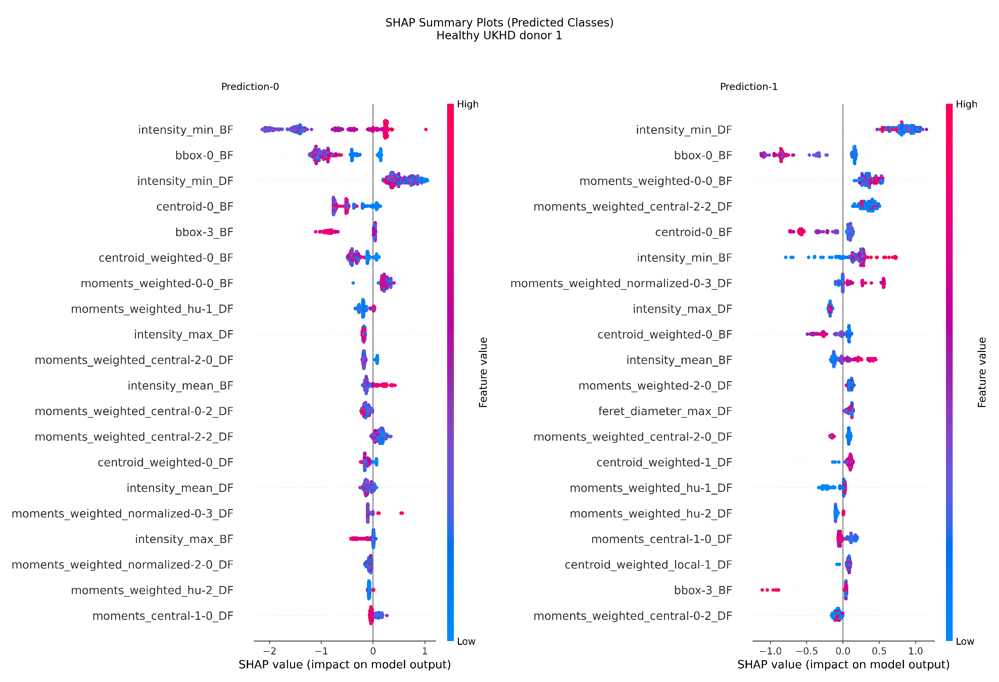

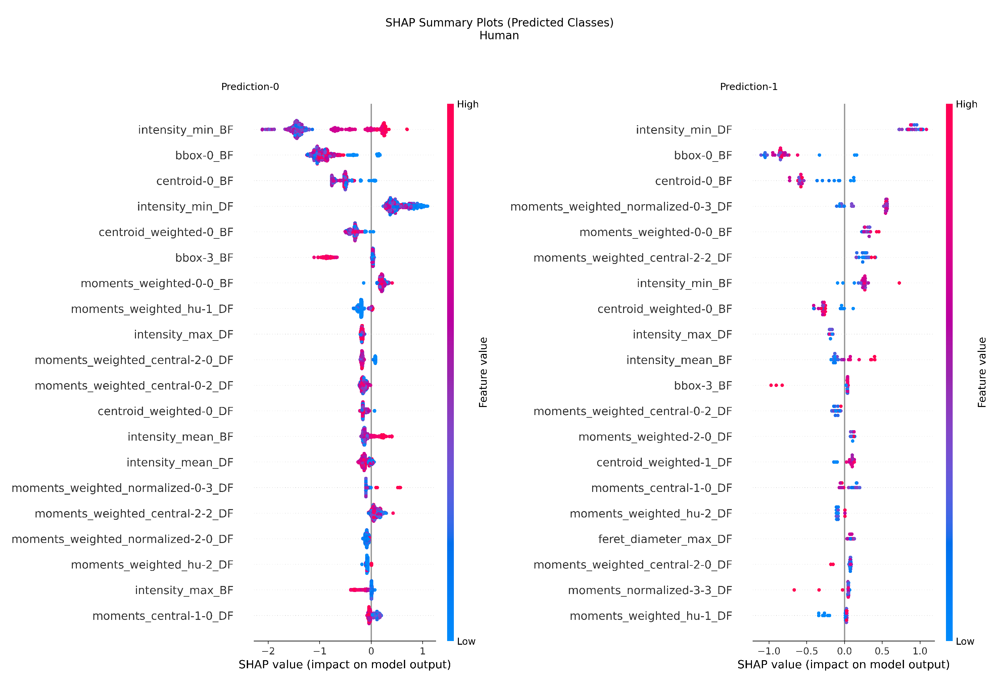

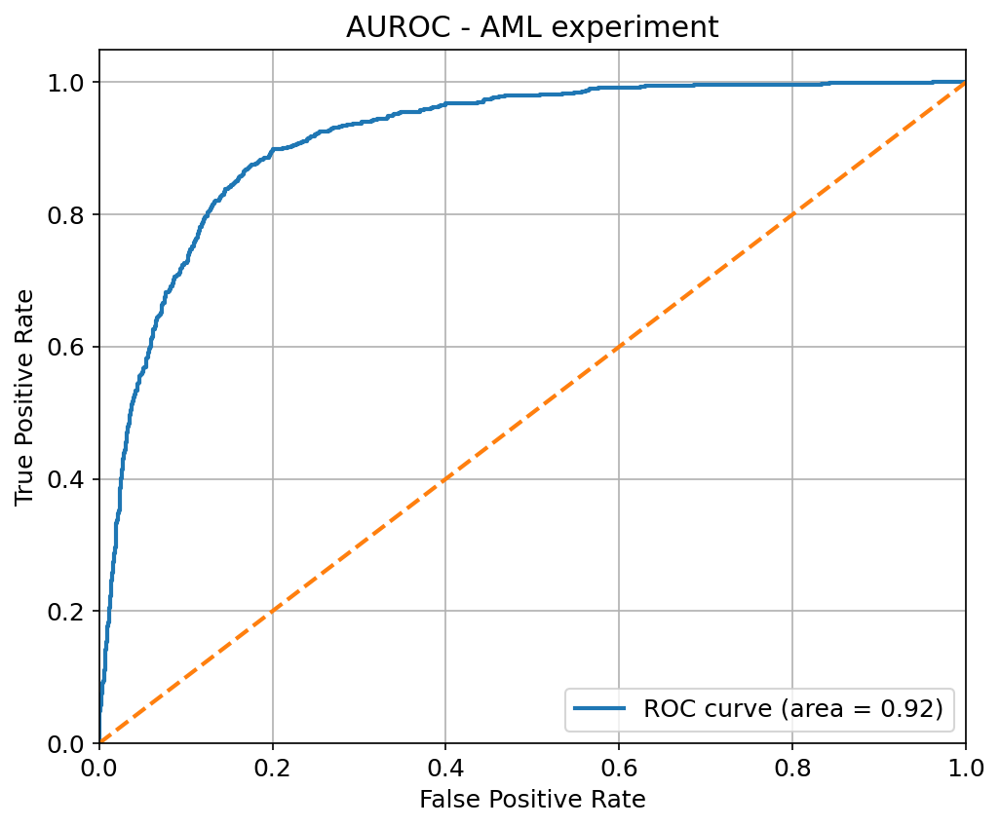

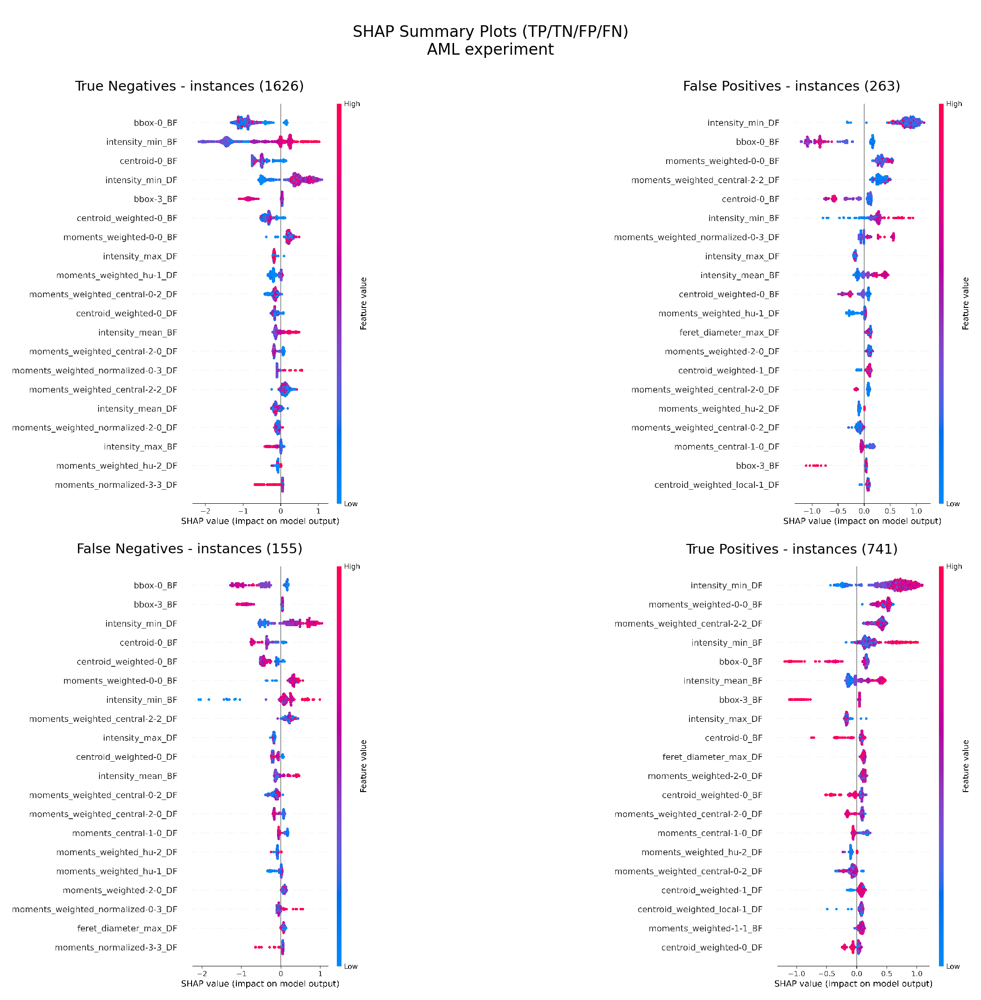

In [26]:
shap_plots_TF(positive_files, 
              negative_files,     
              #model_file="External_Test_before_final_conserve_model_BA_F1_CV/Run_CP_AML_SkI_CP/Test_0/Xgboost_Run_CP_AML_SkI_CP_Cell_Profiler_AML experiment_Ch1_Ch5_Ch6_External_Test_before_final_conserve_model_Checkpoint.pkl",
              model_file="External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV/Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14/Test_0/Xgboost_Run_CP_AML_SkI_CP_Ext_Tr_FHCC2_M14_SkImage_AML experiment_with_External_Training_Ch1_Ch6_External_Test_before_final_conserve_model_Ch1_Ch6_Checkpoint.pkl",
              Channel_annotating_dict = Channel_annotationg_dict, 
              dataset_type = dataset_type, pdf="./New_Shap_Plots_Test/")

In [ ]:
# Convert to DataFrame
df = pd.DataFrame(results_dict)

# Clean the keys: remove prefix and .csv
df.index = df.index.str.replace(r'^Properties_Table_CIF(_\d+)?_', '', regex=True)
df.index = df.index.str.replace('.csv$', '', regex=True)
df.index = df.index.str.replace('BF_cells_on_grid', '', regex=True)
df.index = df.index.str.replace('Cell_Profiler_Features_Metadata/', '', regex=True)
df.index = df.index.str.replace('Human JAK2+ patient samples/', '', regex=True)
df.index = df.index.str.replace('Human normal donors/', '', regex=True)

# Plot
plt.figure(figsize=(10, 6))
sns.heatmap(df, annot=True, fmt=".1f", cmap="viridis")
plt.title("Mutant Percentage")
plt.xlabel("Probability_Threshold")
plt.ylabel("Dataset")
plt.tight_layout()
plt.savefig(f"./Saved_PDFs/Threshold_percentage_Jak2_Cell_Profiler_Ch1_Ch5_Ch6.pdf", bbox_inches="tight")
plt.show()

In [27]:
import re
import ast
store_dict = {}
for each_experiment_run in os.listdir("External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV"):
    if "Run_CP_AML_SkI_CP_Ext_Tr_" in each_experiment_run:
        if "MCW_M14" in each_experiment_run:
            load_file = os.path.join("External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV", each_experiment_run, "Test_0", f"Xgboost_{each_experiment_run}_SkImage_AML experiment_with_External_Training_Ch1_Ch6_External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV.csv")

        else:
            load_file = os.path.join("External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV", each_experiment_run, "Test_1", f"Xgboost_{each_experiment_run}_SkImage_AML experiment_with_External_Training_Ch1_Ch6_External_Test_before_final_conserve_model_Ch1_Ch6_BA_F1_CV.csv")
        loaded_file = pd.read_csv(load_file).drop_duplicates(keep="last")[["Test_Distribtuion", "Balanced_Accuracy"]]
        loaded_file = loaded_file[~loaded_file["Test_Distribtuion"].str.contains("Jak2", case=False, na=False)]
        dist_list = []
        for i in loaded_file["Test_Distribtuion"]:
            # turn string into dict
            d = ast.literal_eval(i)
            
            # extract dataset string
            i = d['Dataset'][0]
            
            # clean it
            i = re.sub(r'^Properties_Table_CIF(_\d+)?_', '', i)   # remove prefix
            i = re.sub(r'\.csv$', '', i)                          # remove suffix
            i = i.replace('BF_cells_on_grid', '')                 
            i = i.replace('Cell_Profiler_Features_Metadata/', '') 
            i = i.replace('Human JAK2+ patient samples/', '')     
            i = i.replace('Human normal donors/', '')
            if i == "Human":
                i = 'Healthy UKHD donor 2'
            dist_list.append(i)
            
        loaded_file["Test_Distribtuion"] = dist_list
        loaded_file = loaded_file.sort_values(by="Test_Distribtuion")
            
        store_dict[each_experiment_run.replace("Run_CP_AML_SkI_CP_", "")] = dict(zip(loaded_file['Test_Distribtuion'], loaded_file['Balanced_Accuracy']))
        store_dict = dict(sorted(store_dict.items()))

In [28]:
store_dict

{'Ext_Tr_FHCC1_M14': {'Healthy FHCC donor 1': 0.9957983193277312,
  'Healthy FHCC donor 2': 0.8904494382022472,
  'Healthy UKHD donor 1': 0.6959578207381371,
  'Healthy UKHD donor 2': 0.9700315457413248,
  'MCW donor 001 re-capture at FHCC': 0.3904761904761905,
  'PDX1-Mouse1_4_hCD45': 1.0,
  'PDX1-Mouse2_10_hCD45_re_export': 0.8668341708542714,
  'PDX1-Mouse2_11_R3 & R2 & R1_hCD45': 0.9508196721311476,
  'PDX2-Mouse3_7_hCD45': 0.9130434782608696,
  'WT control experiment_GFP_neg': 0.7333333333333333,
  'WT control experiment_GFP_pos': 0.6666666666666666},
 'Ext_Tr_FHCC1_M210': {'Healthy FHCC donor 1': 0.9915966386554622,
  'Healthy FHCC donor 2': 0.8426966292134831,
  'Healthy UKHD donor 1': 0.4956063268892794,
  'Healthy UKHD donor 2': 0.8785488958990536,
  'MCW donor 001 re-capture at FHCC': 0.2857142857142857,
  'PDX1-Mouse1_4_hCD45': 0.98,
  'PDX1-Mouse2_10_hCD45_re_export': 1.0,
  'PDX1-Mouse2_11_R3 & R2 & R1_hCD45': 0.9508196721311476,
  'PDX2-Mouse3_7_hCD45': 0.782608695652174,

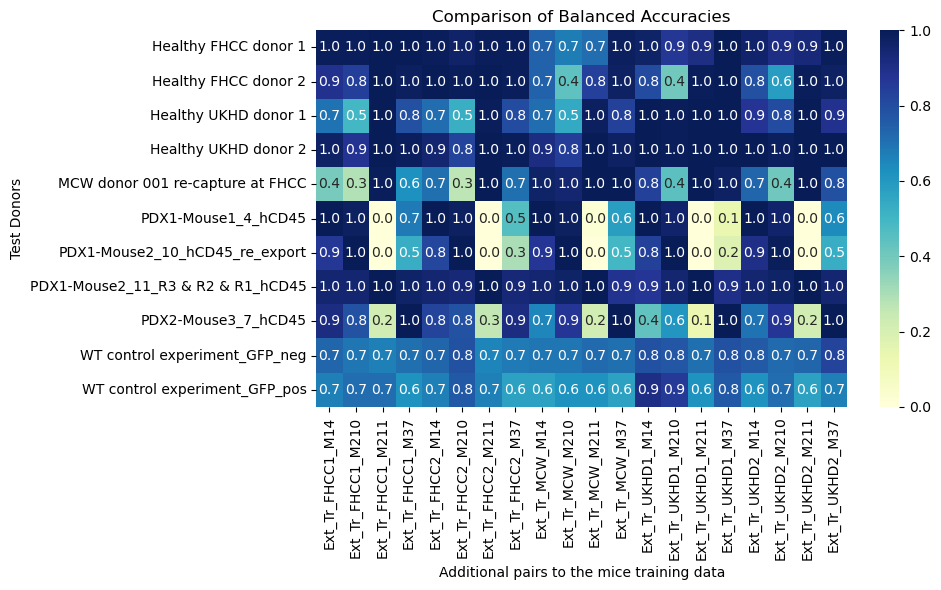

In [71]:
# Convert to DataFrame
df = pd.DataFrame(store_dict)

# Clean the keys: remove prefix and .csv
df.index = df.index.str.replace(r'^Properties_Table_CIF(_\d+)?_', '', regex=True)
df.index = df.index.str.replace('.csv$', '', regex=True)
df.index = df.index.str.replace('BF_cells_on_grid', '', regex=True)
df.index = df.index.str.replace('Cell_Profiler_Features_Metadata/', '', regex=True)
df.index = df.index.str.replace('Human JAK2+ patient samples/', '', regex=True)
df.index = df.index.str.replace('Human normal donors/', '', regex=True)

# Plot
plt.figure(figsize=(10, 6))
sns.heatmap(df, annot=True, fmt=".1f", cmap="YlGnBu")
plt.title("Comparison of Balanced Accuracies")
plt.xlabel("Additional pairs to the mice training data")
plt.ylabel("Test Donors")
plt.tight_layout()
plt.savefig(f"./Saved_PDFs/Training_donor_pair_comparison.pdf", bbox_inches="tight")
plt.show()

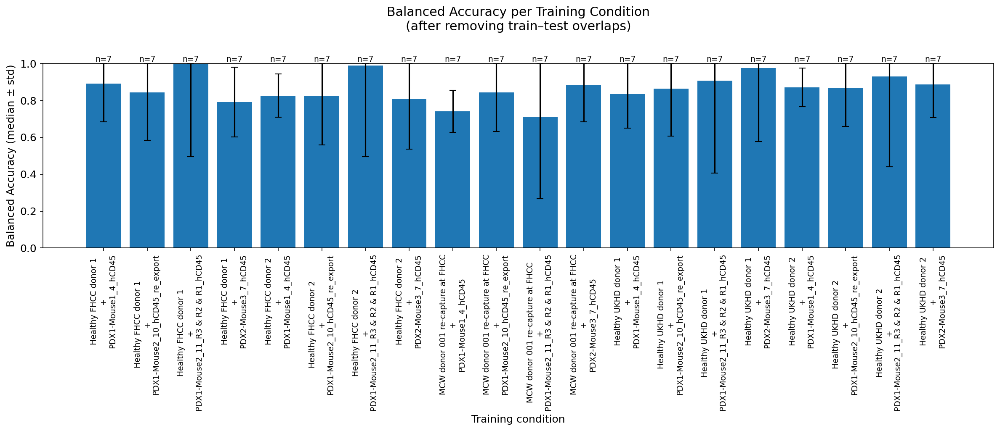

In [47]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import copy


store_dict_copy = copy.deepcopy(store_dict)
# ========== INPUT ==========
# assumes you already have store_dict in memory

for outer_key in store_dict_copy:
    store_dict_copy[outer_key].pop("WT control experiment_GFP_neg", None)
    store_dict_copy[outer_key].pop("WT control experiment_GFP_pos", None)

df = pd.DataFrame(store_dict_copy)

# (optional) your earlier cleaning rules
df.index = df.index.str.replace(r'^Properties_Table_CIF(_\d+)?_', '', regex=True)
df.index = df.index.str.replace('.csv$', '', regex=True)
df.index = df.index.str.replace('BF_cells_on_grid', '', regex=True)
df.index = df.index.str.replace('Cell_Profiler_Features_Metadata/', '', regex=True)
df.index = df.index.str.replace('Human JAK2+ patient samples/', '', regex=True)
df.index = df.index.str.replace('Human normal donors/', '', regex=True)

# Mapping from tokens in training key -> corresponding test-row name
token_to_testname = {
    # donors
    "FHCC1": "Healthy FHCC donor 1",
    "FHCC2": "Healthy FHCC donor 2",
    "UKHD1": "Healthy UKHD donor 1",
    "UKHD2": "Healthy UKHD donor 2",
    "MCW":   "MCW donor 001 re-capture at FHCC",
    # mice
    "M14":   "PDX1-Mouse1_4_hCD45",
    "M210":  "PDX1-Mouse2_10_hCD45_re_export",
    "M211":  "PDX1-Mouse2_11_R3 & R2 & R1_hCD45",
    "M37":   "PDX2-Mouse3_7_hCD45",
}

donor_tokens = ["FHCC1","FHCC2","UKHD1","UKHD2","MCW"]
mouse_tokens = ["M14","M210","M211","M37"]

# ========== COMPUTE MEDIAN / STD AFTER DROPS ==========
xlabels, medians, stds, counts = [], [], [], []

for col in df.columns:
    # rows to exclude if the same sample appears in train
    to_exclude = [name for tok, name in token_to_testname.items() if (tok in col and name in df.index)]
    s = df[col].drop(index=to_exclude, errors="ignore").dropna()

    # sanity
    if len(s) and ((s.min() < 0) or (s.max() > 1)):
        print(f"⚠️ Out-of-range values in {col}: [{s.min():.3f}, {s.max():.3f}]")

    med = float(s.median()) if len(s) else np.nan
    std = float(s.std(ddof=1)) if len(s) > 1 else 0.0

    xlabels.append(col)
    medians.append(med)
    stds.append(std)
    counts.append(int(s.count()))

medians = np.array(medians, dtype=float)
stds    = np.array(stds, dtype=float)
counts  = np.array(counts, dtype=int)

# ========== BUILD READABLE X-TICK LABELS ==========
def make_readable_label(col, two_lines=True):
    donor = next((token_to_testname[t] for t in donor_tokens if t in col), None)
    mouse = next((token_to_testname[t] for t in mouse_tokens if t in col), None)
    if two_lines:
        # put donor on first line, mouse on second
        parts = [p for p in [donor, mouse] if p]
        return "\n+\n".join(parts) if parts else col
    else:
        parts = [p for p in [donor, mouse] if p]
        return "\n+\n".join(parts) if parts else col

two_line_labels = True  # set False for single-line labels
readable_labels = [make_readable_label(c, two_lines=two_line_labels) for c in xlabels]

# ========== ERROR BARS (CLIPPED) ==========
lower = np.maximum(medians - stds, 0.0)
upper = np.minimum(medians + stds, 1.0)
yerr  = np.vstack([medians - lower, upper - medians])  # (2, n)

# ========== PLOT ==========
os.makedirs("./Saved_PDFs", exist_ok=True)

fig = plt.figure(figsize=(16, 7))
x = np.arange(len(xlabels))

plt.bar(x, medians, yerr=yerr, capsize=4)
plt.xticks(x, readable_labels, rotation=90 if two_line_labels else 45, ha="center" if two_line_labels else "right", fontsize=9)

plt.ylim(0, 1)
plt.ylabel("Balanced Accuracy (median ± std)")
plt.xlabel("Training condition")
plt.title("Balanced Accuracy per Training Condition\n(after removing train–test overlaps)\n\n")

# Single total n above title (outside plot area)
#total_n = int(counts.sum())
#plt.figtext(0.5, 1.04, f"Total n = {total_n}", ha="center", va="bottom", fontsize=12)

# annotate n per bar
for xi, m, n in zip(x, medians, counts):
    if np.isfinite(m):
        plt.text(xi, 1.0,#min(1.0, m + (yerr[1, xi] if np.isfinite(yerr[1, xi]) else 0) + 0.02),
                 f"n={n}", ha="center", va="bottom", fontsize=9)

plt.tight_layout()
plt.savefig("./Saved_PDFs/Training_donor_pair_median_std_without_WT_Control.pdf", bbox_inches="tight")
plt.show()

# ========== SUMMARY CSV ==========
summary_df = pd.DataFrame({
    "training_key": xlabels,
    "readable_label": [lbl.replace("\n+\n", " + ") for lbl in readable_labels],
    "n": counts,
    "median": medians,
    "std": stds,
    "lower_clipped": lower,
    "upper_clipped": upper
})
#summary_df.to_csv("./Saved_PDFs/Training_donor_pair_median_std_summary.csv", index=False)
#print(summary_df)


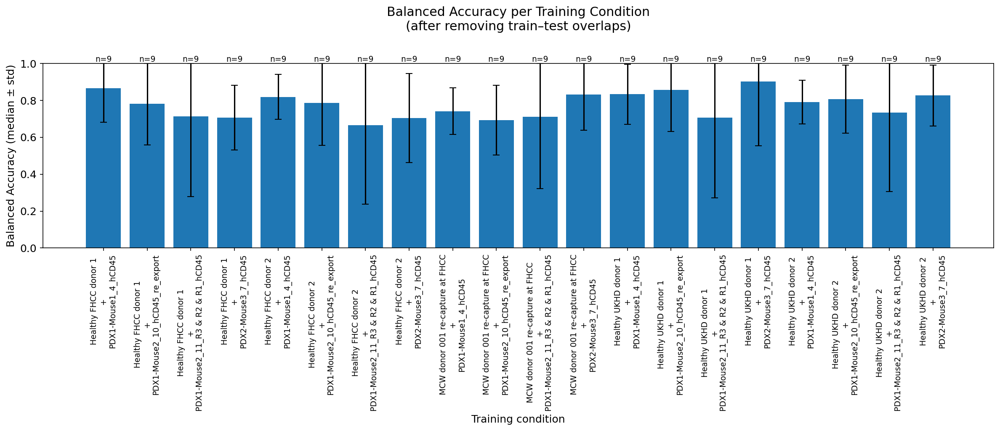

In [48]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import copy


store_dict_copy = copy.deepcopy(store_dict)
# ========== INPUT ==========
# assumes you already have store_dict in memory

#for outer_key in store_dict_copy:
#    store_dict_copy[outer_key].pop("WT control experiment_GFP_neg", None)
#    store_dict_copy[outer_key].pop("WT control experiment_GFP_pos", None)

df = pd.DataFrame(store_dict_copy)

# (optional) your earlier cleaning rules
df.index = df.index.str.replace(r'^Properties_Table_CIF(_\d+)?_', '', regex=True)
df.index = df.index.str.replace('.csv$', '', regex=True)
df.index = df.index.str.replace('BF_cells_on_grid', '', regex=True)
df.index = df.index.str.replace('Cell_Profiler_Features_Metadata/', '', regex=True)
df.index = df.index.str.replace('Human JAK2+ patient samples/', '', regex=True)
df.index = df.index.str.replace('Human normal donors/', '', regex=True)

# Mapping from tokens in training key -> corresponding test-row name
token_to_testname = {
    # donors
    "FHCC1": "Healthy FHCC donor 1",
    "FHCC2": "Healthy FHCC donor 2",
    "UKHD1": "Healthy UKHD donor 1",
    "UKHD2": "Healthy UKHD donor 2",
    "MCW":   "MCW donor 001 re-capture at FHCC",
    # mice
    "M14":   "PDX1-Mouse1_4_hCD45",
    "M210":  "PDX1-Mouse2_10_hCD45_re_export",
    "M211":  "PDX1-Mouse2_11_R3 & R2 & R1_hCD45",
    "M37":   "PDX2-Mouse3_7_hCD45",
}

donor_tokens = ["FHCC1","FHCC2","UKHD1","UKHD2","MCW"]
mouse_tokens = ["M14","M210","M211","M37"]

# ========== COMPUTE MEDIAN / STD AFTER DROPS ==========
xlabels, medians, stds, counts = [], [], [], []

for col in df.columns:
    # rows to exclude if the same sample appears in train
    to_exclude = [name for tok, name in token_to_testname.items() if (tok in col and name in df.index)]
    s = df[col].drop(index=to_exclude, errors="ignore").dropna()

    # sanity
    if len(s) and ((s.min() < 0) or (s.max() > 1)):
        print(f"⚠️ Out-of-range values in {col}: [{s.min():.3f}, {s.max():.3f}]")

    med = float(s.median()) if len(s) else np.nan
    std = float(s.std(ddof=1)) if len(s) > 1 else 0.0

    xlabels.append(col)
    medians.append(med)
    stds.append(std)
    counts.append(int(s.count()))

medians = np.array(medians, dtype=float)
stds    = np.array(stds, dtype=float)
counts  = np.array(counts, dtype=int)

# ========== BUILD READABLE X-TICK LABELS ==========
def make_readable_label(col, two_lines=True):
    donor = next((token_to_testname[t] for t in donor_tokens if t in col), None)
    mouse = next((token_to_testname[t] for t in mouse_tokens if t in col), None)
    if two_lines:
        # put donor on first line, mouse on second
        parts = [p for p in [donor, mouse] if p]
        return "\n+\n".join(parts) if parts else col
    else:
        parts = [p for p in [donor, mouse] if p]
        return "\n+\n".join(parts) if parts else col

two_line_labels = True  # set False for single-line labels
readable_labels = [make_readable_label(c, two_lines=two_line_labels) for c in xlabels]

# ========== ERROR BARS (CLIPPED) ==========
lower = np.maximum(medians - stds, 0.0)
upper = np.minimum(medians + stds, 1.0)
yerr  = np.vstack([medians - lower, upper - medians])  # (2, n)

# ========== PLOT ==========
os.makedirs("./Saved_PDFs", exist_ok=True)

fig = plt.figure(figsize=(16, 7))
x = np.arange(len(xlabels))

plt.bar(x, medians, yerr=yerr, capsize=4)
plt.xticks(x, readable_labels, rotation=90 if two_line_labels else 45, ha="center" if two_line_labels else "right", fontsize=9)

plt.ylim(0, 1)
plt.ylabel("Balanced Accuracy (median ± std)")
plt.xlabel("Training condition")
plt.title("Balanced Accuracy per Training Condition\n(after removing train–test overlaps)\n\n")

# Single total n above title (outside plot area)
#total_n = int(counts.sum())
#plt.figtext(0.5, 1.04, f"Total n = {total_n}", ha="center", va="bottom", fontsize=12)

# annotate n per bar
for xi, m, n in zip(x, medians, counts):
    if np.isfinite(m):
        plt.text(xi, 1.0,#min(1.0, m + (yerr[1, xi] if np.isfinite(yerr[1, xi]) else 0) + 0.02),
                 f"n={n}", ha="center", va="bottom", fontsize=9)

plt.tight_layout()
plt.savefig("./Saved_PDFs/Training_donor_pair_median_std_with_WT_Control.pdf", bbox_inches="tight")
plt.show()

# ========== SUMMARY CSV ==========
summary_df = pd.DataFrame({
    "training_key": xlabels,
    "readable_label": [lbl.replace("\n+\n", " + ") for lbl in readable_labels],
    "n": counts,
    "median": medians,
    "std": stds,
    "lower_clipped": lower,
    "upper_clipped": upper
})
#summary_df.to_csv("./Saved_PDFs/Training_donor_pair_median_std_summary.csv", index=False)
#print(summary_df)
